# Obtain EOFs for MJO phase composite
2025.2.20
Mu-Ting Chien

In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter1d
import sys
sys.path.append('/barnes-engr-scratch1/c832572266/Function/')
from scipy import signal
#import KW_diagnostics as KW
import mjo_mean_state_diagnostics_uw as MJO
import os
import cartopy.util as cartopy_util
import cartopy.crs as ccrs
from datetime import datetime, timezone

In [2]:
DIR               = '/barnes-engr-scratch1/c832572266/'
file_dir_in_era5  = DIR + 'data_output/ERA5_anomaly/'
file_dir_obs_ace2 = DIR + 'data_output/ace2/obs_compare_with_ace2/'
file_dir_out      = DIR + 'data_output/ace2/obs_compare_with_ace2/MJO/'
fig_dir_era5      = DIR + 'figure/era5_fig/MJO/'
fig_dir_ace2      = DIR + 'figure/ace2_fig/MJO/'
dir_in_era5_TC    = DIR + 'data_output/ERA5TC_muting/StichNodes/'
os.makedirs(fig_dir_era5, exist_ok=True)
os.makedirs(fig_dir_ace2, exist_ok=True)
os.makedirs(file_dir_out, exist_ok=True)

# Load u850, u200, precip anomaly

In [3]:
############################
# 1. Load U850, U200, and precip anomaly from ERA5
##############################
vname_short_list = list(['u'])
iv = 0

# Load u
ds            = xr.open_dataset(file_dir_in_era5 + vname_short_list[iv]+'_ano_era5_2001_2010_15SN_2.5deg.nc')
ds1           = ds.sel(level=slice(800, 900))
u850_15SN_ano = ds1['u_ano_15S_15N_latavg'].mean(dim="level")
u850_ano      = ds1['u_ano'].mean(dim="level")
ds3           = ds.sel(level=200, drop=True)
u200_15SN_ano = ds3['u_ano_15S_15N_latavg']
u200_ano      = ds3['u_ano']

# Load precip
ds     = xr.open_dataset(file_dir_obs_ace2 + 'pr_ano_15SN_imerg_2001-2010_2.5deg.nc')
ds     = ds.isel(time=slice(0, -4))
pr_ano = ds['pr_ano_2p5deg'][:, :, :] # make sure the time dimension is same as u
lat    = ds['lat'] # 15S-15N

################################
# Calculate meridional average of precip (15S-15N)
#####################
# Convert latitude to radians for cosine weighting
lat_radians = np.deg2rad(lat)
# Create weights based on cos(latitude)
weights = np.cos(lat_radians)
pr_15SN_ano = (pr_ano * weights).sum(dim="lat", skipna=True) / weights.where(~np.isnan(pr_ano)).sum(dim="lat", skipna=True)

####################
# Make sure the shape of u850, u200, pr is the same
#########################################
if np.shape(u200_15SN_ano)!=np.shape(pr_15SN_ano) or np.shape(u850_15SN_ano)!=np.shape(pr_15SN_ano):
    print('Shape mismatch between u200, u850, precip!')


In [4]:
# Remove 120-day running mean to get subseasonal variabiltiy (this is used for composite 8-phase map)
running_mean = uniform_filter1d(pr_ano, size=120*4, axis=0, mode='nearest')
pr_ano_final = pr_ano - running_mean
#
running_mean = uniform_filter1d(u850_ano, size=120*4, axis=0, mode='nearest')
u850_ano_final = u850_ano - running_mean
#
running_mean = uniform_filter1d(u200_ano, size=120*4, axis=0, mode='nearest')
u200_ano_final = u200_ano - running_mean

In [5]:
lon = ds['lon']
nlon = np.size(lon)

time = ds['time']
nt = np.size(time)

# Pre-preocessing before EOF

In [6]:
# Remove 120-day running mean


# Compute 120-day running mean along time axis (axis=0)
running_mean = uniform_filter1d(u850_15SN_ano, size=120*4, axis=0, mode='nearest')
# Remove the running mean
u850_15SN_ano_highpass = u850_15SN_ano - running_mean

# Compute 120-day running mean along time axis (axis=0)
running_mean = uniform_filter1d(u200_15SN_ano, size=120*4, axis=0, mode='nearest')
# Remove the running mean
u200_15SN_ano_highpass = u200_15SN_ano - running_mean


# Compute 120-day running mean along time axis (axis=0)
running_mean = uniform_filter1d(pr_15SN_ano, size=120*4, axis=0, mode='nearest')
# Remove the running mean
pr_15SN_ano_highpass = pr_15SN_ano - running_mean

##################
# Final data to use before EOF:
##################
u850_final = u850_15SN_ano_highpass.values
u200_final = u200_15SN_ano_highpass.values
pr_final = pr_15SN_ano_highpass.values

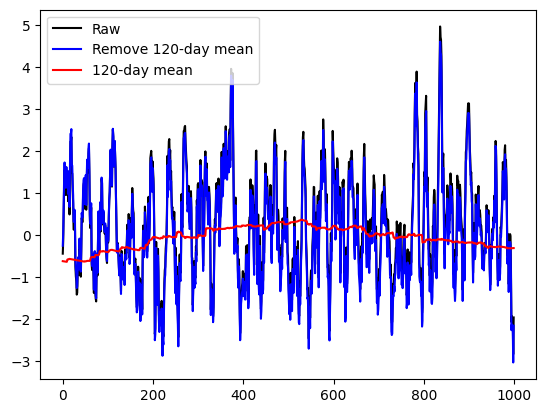

In [8]:
t = np.arange(0, 1000)
plt.plot(t, u850_15SN_ano[t, 0], 'k')
plt.plot(t, u850_15SN_ano_highpass[t, 0], 'b')
plt.plot(t, running_mean[t, 0], 'r')
plt.legend(['Raw','Remove 120-day mean','120-day mean'])
plt.show()

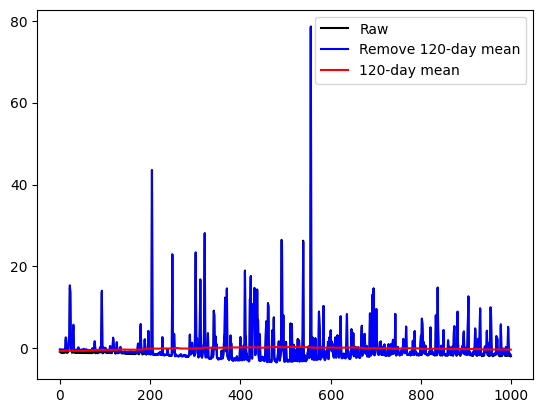

In [11]:
t = np.arange(0, 1000)
plt.plot(t, pr_15SN_ano[t, 0], 'k')
plt.plot(t, pr_15SN_ano_highpass[t, 0], 'b')
plt.plot(t, running_mean[t, 0], 'r')
plt.legend(['Raw','Remove 120-day mean','120-day mean'])
plt.show()

# Test

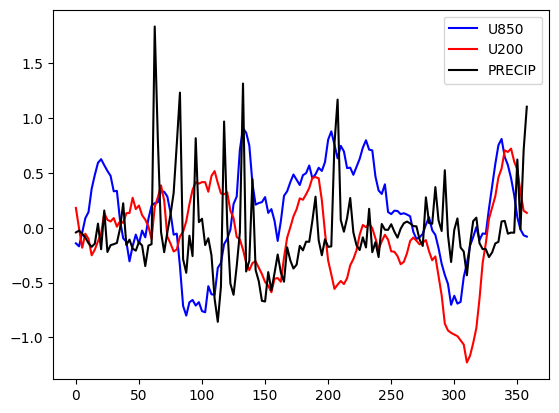

In [13]:
# print X
plt.plot(lon, X[:nlon, 0],'b')
plt.plot(lon, X[nlon:2*nlon, 0],'r')
plt.plot(lon, X[nlon*2:3*nlon, 0],'k')
plt.legend(['U850','U200','PRECIP'])

# Test

In [20]:
'''
EOF function
'''
def normalize_before_ceof(u850_f_merave,u200_f_merave,olr_f_merave): #(time,lon)
    # normalize the data before doing eof, 
    # you need to do this because the unit of the two dataset is not the same
    u850_f_merave = np.transpose(u850_f_merave)
    u200_f_merave = np.transpose(u200_f_merave)
    olr_f_merave  = np.transpose(olr_f_merave)
    nlon = np.size(u850_f_merave,0)
    nt = np.size(u850_f_merave,1)
    
    mu_u850 = np.nanmean(u850_f_merave)
    std_u850 = np.nanstd(u850_f_merave)
    u850_norm = ( u850_f_merave - mu_u850 )/std_u850
    
    mu_u200 = np.nanmean(u200_f_merave)
    std_u200 = np.nanstd(u200_f_merave)
    u200_norm = ( u200_f_merave - mu_u200 )/std_u200
    
    mu_olr = np.nanmean(olr_f_merave) 
    std_olr = np.nanstd(olr_f_merave)
    olr_norm = ( olr_f_merave - mu_olr )/std_olr

    X = np.zeros([nlon*3,nt])
    X[0:nlon,:] = u850_norm
    X[nlon:2*nlon,:] = u200_norm
    X[2*nlon:3*nlon,:] = olr_norm
    return X, mu_u850, std_u850,\
           mu_u200, std_u200,\
           mu_olr,  std_olr  


In [ ]:
def eof(xx): #x=x(structure dim, sampling dim)
    u, s, v = np.linalg.svd(xx, full_matrices=False)
    EOF = np.transpose(u) #EOFi=EOF[i-1] EOF1=EOF[0],EOF2=EOF[1],....
    #print('u:',np.shape(u),' ,xx:',np.shape(xx))
    PC = np.dot(np.transpose(u),xx) #PCi =pc[i-1], pc1=pc[0],pc2=pc[1],...
    nt = np.size(xx,1)
    eigval = s**2/nt
    eigval_explained_var = eigval/np.sum(eigval)*100 #percent
    
    # calculate degree of freedom so that we can do North test
    L = 1 #one-lag auto-corelation
    B = 0
    for k in range(L-1,nt-L):
        B = B + np.sum( xx[:,k]*xx[:,k+L] )
    
    phi_L = 1/(nt-2*L)*B
    phi_0 = 1/nt*np.sum( xx**2 )
    r_L     = phi_L/phi_0
    #r_L     = np.nanmean(phi_L)/np.nanmean(phi_0)
    dof = ( 1-r_L**2 )/( 1+r_L**2 )*nt
    
    eigval_err = eigval_explained_var*np.sqrt(2/dof)
    return EOF, PC, eigval, eigval_explained_var, eigval_err, dof, phi_0, phi_L

# Use pr, u200, u850 to construct RMM index!

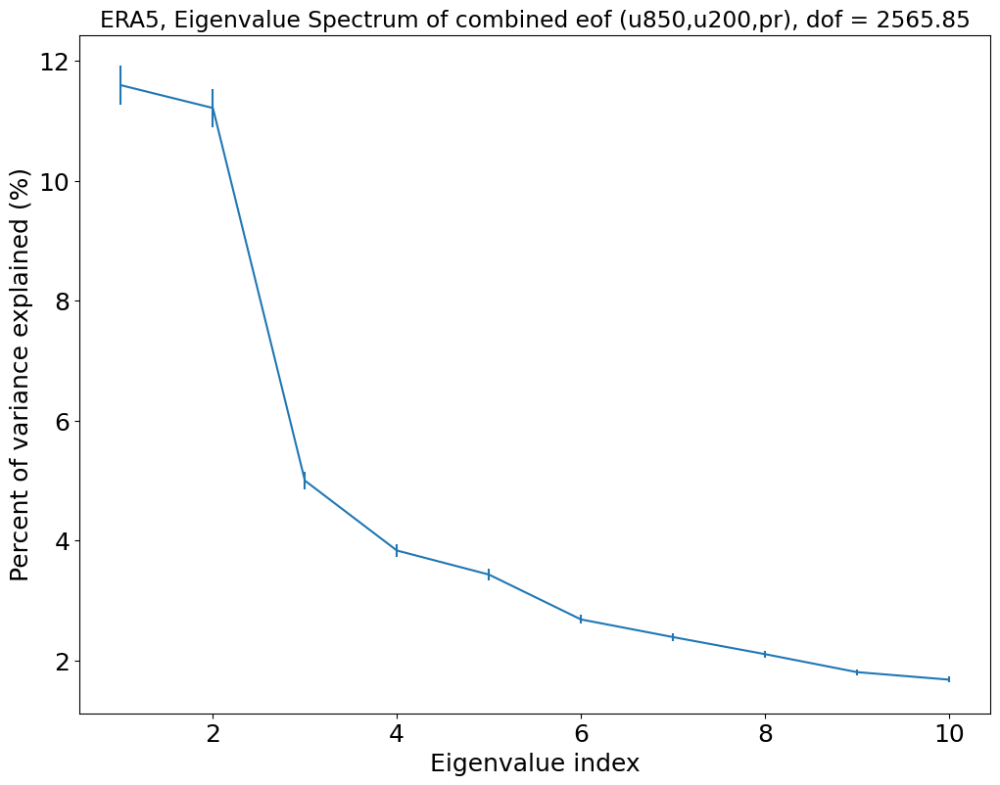

In [21]:
calc_EOF = 1
if calc_EOF == 1:

    #Normalize U850,U200,pr before doing combined EOF, generate single matrix X
    #X, mu_u850, std_u850, mu_u200, std_u200, mu_pr, std_pr = MJO.normalize_before_ceof(u850_final, u200_final, pr_final) 
    X, mu_u850, std_u850, mu_u200, std_u200, mu_pr, std_pr = normalize_before_ceof(u850_final, u200_final, pr_final) 
    X_u850 = X[0:nlon,:]
    X_u200 = X[nlon:2*nlon,:]
    X_olr  = X[2*nlon:3*nlon,:]

    #############
    # EOF Analysis
    ################
    EOF, PC, eigval, eigval_explained_var, eigval_err, dof, phi_0, phi_L = MJO.eof(X)    
    EOF_u850 = EOF[:,0:nlon]
    EOF_u200 = EOF[:,nlon:2*nlon]
    EOF_pr   = EOF[:,2*nlon:3*nlon]
    PC_u850  = np.matmul(EOF_u850,X_u850)
    PC_u200  = np.matmul(EOF_u200,X_u200)
    PC_pr    = np.matmul(EOF_pr,X_olr)

    # plot errorplot
    fig = plt.figure(figsize=(12, 9))
    plt.errorbar(x=range(1,11), y=eigval_explained_var[:10], yerr=eigval_err[:10])
    plt.rcParams.update({'font.size': 14})
    DOF = f"{dof:.2f}"
    plt.title('ERA5, Eigenvalue Spectrum of combined eof (u850,u200,pr), dof = '+DOF)
    #plt.title(model_name+'Eigenvalue Spectrum of combined eof (u850,u250,olr), dof = '+DOF)
    plt.ylabel('Percent of variance explained (%)')
    plt.xlabel('Eigenvalue index')
    #plt.savefig(dir_out+'/figure/ceof_rmm/'+model_name+'eigerr.png')

    #########
    # Plot EOF, PC1-PC2 lag-regression, Calculate RMM index  
    ############
    # plot eof
    nlon = np.size(lon)
    # Caution: change this when usin different data, make sure EOF amp-lon plot looks the same as WH2004
    # Otherwise, you need to change! ex: here, RMM1=-PC2, RMM2= PC1

    EOF_u850_1 = EOF[1,0:nlon]
    EOF_u200_1 = EOF[1,nlon:nlon*2]
    EOF_pr_1   =  EOF[1,nlon*2:nlon*3] 
    EOF_u850_2 = -EOF[0,0:nlon]
    EOF_u200_2 = -EOF[0,nlon:nlon*2]
    EOF_pr_2   = -EOF[0,nlon*2:nlon*3] 

    # Save EOF
    #np.savez(file_dir_out + 'MJO_EOF_ERA5_2001_2010.npz', EOF=EOF, EOF_u850_1 = EOF_u850_1, EOF_u850_2 = EOF_u850_2,\
    #        EOF_u200_1=EOF_u200_1, EOF_u200_2=EOF_u200_2, EOF_pr_1=EOF_pr_1, EOF_pr_2=EOF_pr_2, lon=lon)


else: # Load EOF
    data = np.load(file_dir_out + 'MJO_EOF_ERA5_2001_2010.npz')
    EOF = data['EOF']
    lon = data['lon']
    EOF_u850_1 = data['EOF_u850_1']
    EOF_u850_2 = data['EOF_u850_2']
    EOF_u200_1 = data['EOF_u200_1']
    EOF_u200_2 = data['EOF_u200_2']
    EOF_pr_1 = data['EOF_pr_1']
    EOF_pr_2 = data['EOF_pr_1']

    nlon = np.size(lon)

In [24]:
print( np.sum(EOF_pr_1**2), np.sum(EOF_u850_1**2), np.sum(EOF_u200_1**2))
print( np.sum(EOF_pr_2**2), np.sum(EOF_u850_2**2), np.sum(EOF_u200_2**2))


0.03951610929897798 0.4186525074915904 0.5418313832094312
0.02917463318542475 0.5301762464740061 0.4406491203405696


In [10]:
print(mu_pr)
print(std_pr)

-0.0017500262287475175
5.634662191135247


# Test plotting EOF

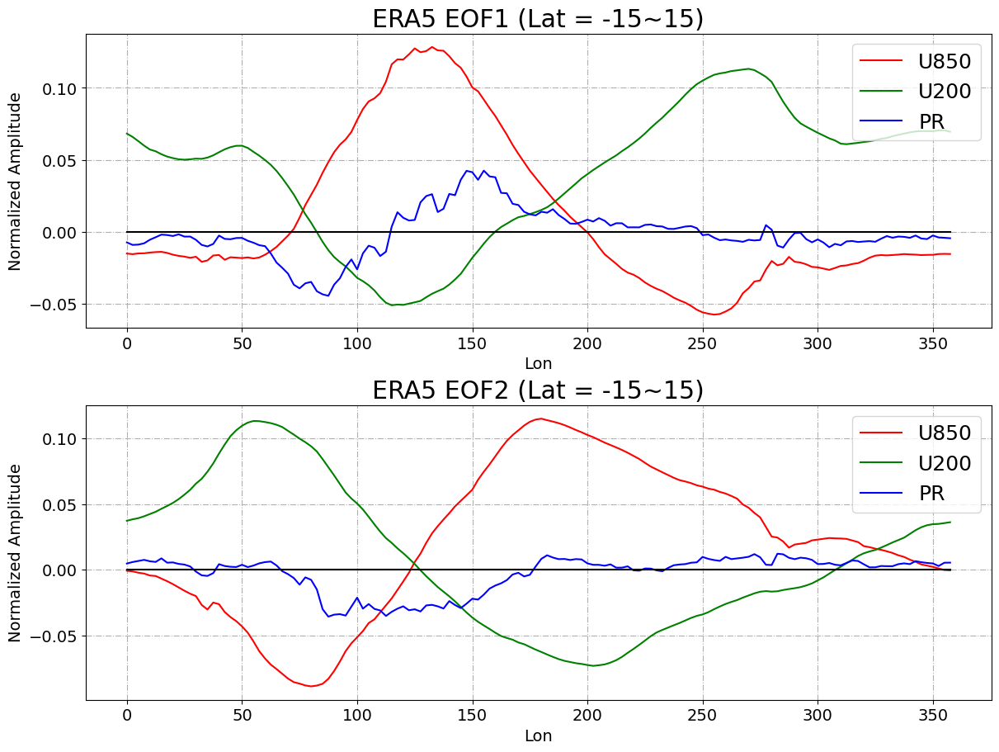

In [22]:
model_name = 'ERA5'
latmin = -15
latmax = 15

zero = np.zeros(nlon)
fig, axs = plt.subplots(2, 1, constrained_layout=True, figsize=(12,9))
plt.rcParams.update({'font.size': 18})
axs[0].plot(lon,EOF_u850_1,'r',lon,EOF_u200_1,'g',lon,EOF_pr_1,'b',lon,zero,'k')
axs[0].grid(True, linestyle='-.')
axs[0].legend(('U850','U200','PR'),loc='upper right')
#axs[0].legend(('U850','U250','OLR'),loc='upper right')
axs[0].set_title(model_name+' EOF1 (Lat = '+str(latmin)+'~'+str(latmax)+')')
axs[0].set_xlabel('Lon')
axs[0].set_ylabel('Normalized Amplitude')
axs[1].plot(lon,EOF_u850_2,'r',lon,EOF_u200_2,'g',lon,EOF_pr_2,'b',lon,zero,'k')
axs[1].grid(True, linestyle='-.')
axs[1].legend(('U850','U200','PR'),loc='upper right')
#axs[1].legend(('U850','U250','OLR'),loc='upper right')
axs[1].set_title(model_name+' EOF2 (Lat = '+str(latmin)+'~'+str(latmax)+')')
axs[1].set_xlabel('Lon')
axs[1].set_ylabel('Normalized Amplitude')
#plt.savefig(dir_out+'/figure/ceof_rmm/'+model_name+'eof.png')
plt.show()

# Plot EOF

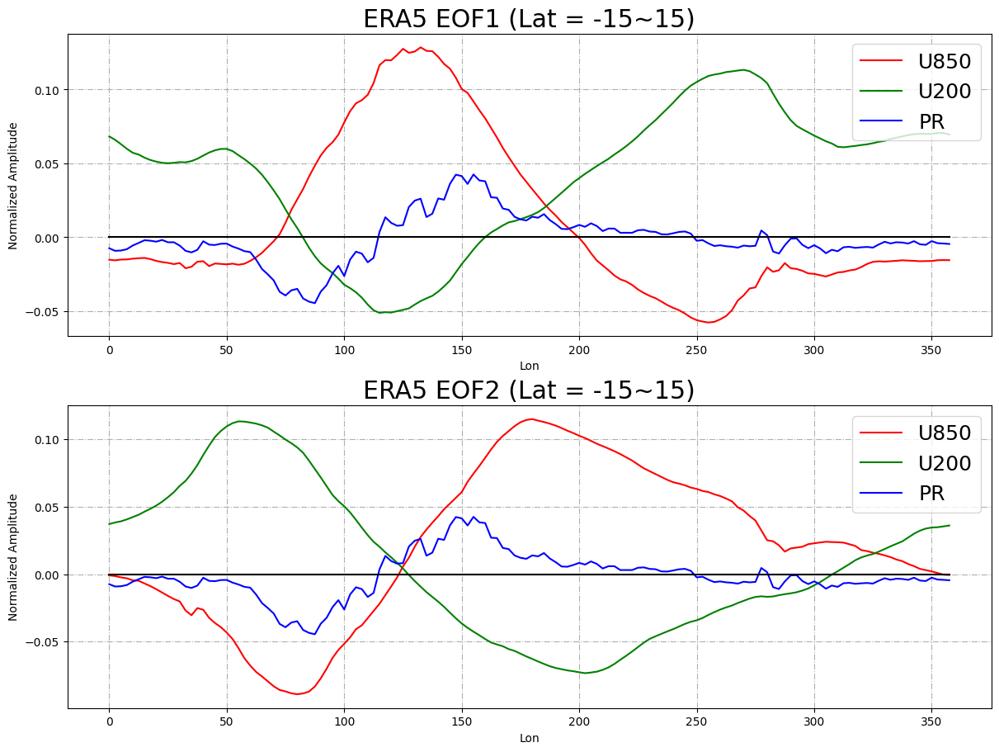

In [7]:
model_name = 'ERA5'
latmin = -15
latmax = 15

zero = np.zeros(nlon)
fig, axs = plt.subplots(2, 1, constrained_layout=True, figsize=(12,9))
plt.rcParams.update({'font.size': 18})
axs[0].plot(lon,EOF_u850_1,'r',lon,EOF_u200_1,'g',lon,EOF_pr_1,'b',lon,zero,'k')
axs[0].grid(True, linestyle='-.')
axs[0].legend(('U850','U200','PR'),loc='upper right')
#axs[0].legend(('U850','U250','OLR'),loc='upper right')
axs[0].set_title(model_name+' EOF1 (Lat = '+str(latmin)+'~'+str(latmax)+')')
axs[0].set_xlabel('Lon')
axs[0].set_ylabel('Normalized Amplitude')
axs[1].plot(lon,EOF_u850_2,'r',lon,EOF_u200_2,'g',lon,EOF_pr_2,'b',lon,zero,'k')
axs[1].grid(True, linestyle='-.')
axs[1].legend(('U850','U200','PR'),loc='upper right')
#axs[1].legend(('U850','U250','OLR'),loc='upper right')
axs[1].set_title(model_name+' EOF2 (Lat = '+str(latmin)+'~'+str(latmax)+')')
axs[1].set_xlabel('Lon')
axs[1].set_ylabel('Normalized Amplitude')
#plt.savefig(dir_out+'/figure/ceof_rmm/'+model_name+'eof.png')
plt.show()

NameError: name 'model_name' is not defined

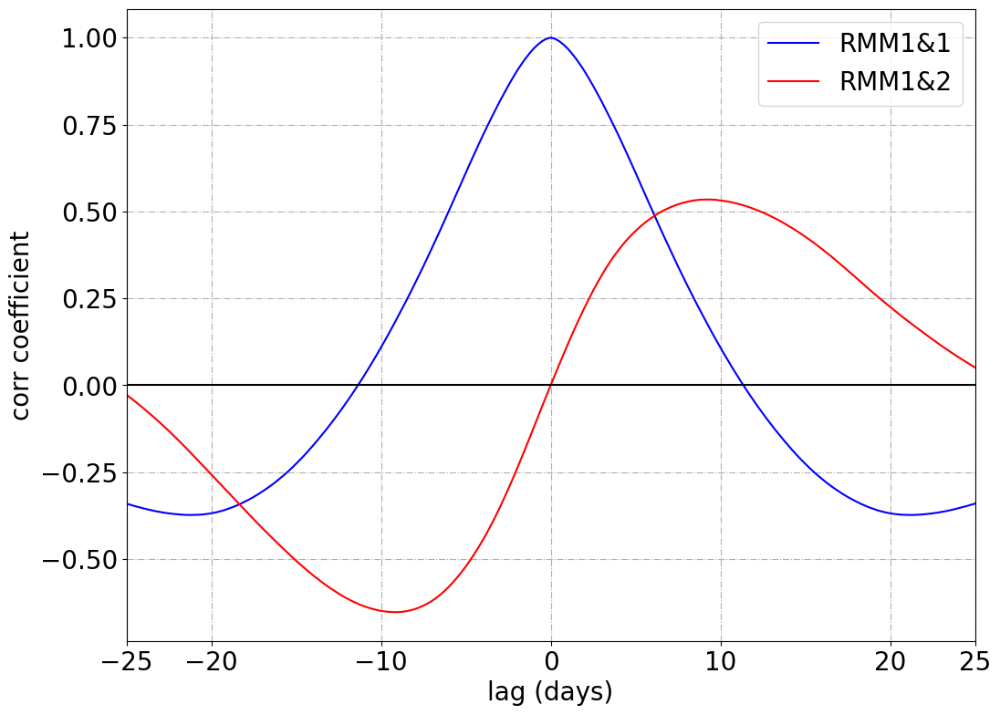

In [6]:
# plot pc lag-regression
calc_rmm = 0

if calc_rmm == 1:
    #ERA5
    rmm1 = PC[0] #or -PC[0]. you may want to check this by doing the phase composite (this could also be negative) (Check if each phase corresponds to the correct enhanced convection region)!
    rmm2 = PC[1] #or -PC[1]. you may want to check this by doing the phase composite (this could also be negative)!
    rmm1_u850 = PC_u850[0]
    rmm2_u850 = PC_u850[1]
    rmm1_u200 = PC_u200[0]
    rmm2_u200 = PC_u200[1]
    rmm1_pr  = PC_pr[0]
    rmm2_pr  = PC_pr[1]

    # SAVE RMM!
    output = file_dir_out+'RMM_PC_ERA5_2001_2010.npz'
    np.savez(output, X=X,EOF=EOF,PC=PC,rmm1=rmm1,rmm2=rmm2,\
                rmm1_u850=rmm1_u850, rmm2_u850=rmm2_u850,\
                rmm1_u200=rmm1_u200, rmm2_u200=rmm2_u200,\
                rmm1_pr =rmm1_pr,  rmm2_pr=rmm2_pr)

else:
    data = np.load(file_dir_out+'RMM_PC_ERA5_2001_2010.npz')
    rmm1 = data['rmm1']
    rmm2 = data['rmm2']


lag = 25*4

cor_11 = np.zeros([2*lag+1])
cor_21 = np.zeros([2*lag+1])
for i in range(1,lag+1):
    k = lag+1-i
    temp = np.corrcoef( rmm1[0:nt-k], rmm1[k:nt] ) 
    cor_11[i-1] = temp[0,1]
    temp = np.corrcoef( rmm2[0:nt-k], rmm1[k:nt] )
    cor_21[i-1] = temp[0,1]
    temp = np.corrcoef( rmm1[0:nt-i+1],rmm1[i-1:nt] ) 
    cor_11[lag+i-1] = temp[0,1]
    temp = np.corrcoef( rmm1[0:nt-i+1],rmm2[i-1:nt] )
    cor_21[lag+i-1] = temp[0,1]
temp = np.corrcoef( rmm1[0:nt-lag],rmm1[lag:nt] )
cor_11[2*lag] = temp[0,1]
temp = np.corrcoef( rmm1[0:nt-lag],rmm2[lag:nt] )
cor_21[2*lag] = temp[0,1]
LAG = np.arange(-lag,lag+1)

zero = np.zeros([2*lag+1])
fig = plt.figure(figsize=(12, 9))
plt.rcParams.update({'font.size': 20})
plt.grid(True, linestyle='-.')
plt.plot(LAG/4,cor_11,'b',LAG/4,cor_21,'r',LAG/4,zero,'k')
plt.xlim([-25,25])
plt.xticks([-25,-20,-10,0,10,20,25])
plt.xlabel('lag (days)')
plt.ylabel('corr coefficient')
plt.legend(('RMM1&1','RMM1&2'))
plt.title(model_name+'PC lagcorr')
#plt.savefig(dir_out+'/figure/ceof_rmm/'+model_name+'pc_lagcorr.png')
plt.show()

'''
RMM 8 phase index
'''
time_val = time.values
n,RMM_ind,rmm1_norm,rmm2_norm = MJO.rmm_eight_phase_index(rmm1,rmm2,time,rmm1,rmm2)

#plot 8 phase diagram
ma = 4.5 #max amplitude
z = np.zeros(4) #zero
h = np.array([1,2,3,ma]) #horizontal
TT = np.array([0.5**0.5,2,3,ma]) #tilt
dphi = 2*np.pi/30
phi = np.arange(0,2*np.pi+dphi,dphi)
cos = np.cos(phi) #weak mjo (circle) 
sin = np.sin(phi) #weak mjo (circle)
#
fig = plt.figure(figsize=(12, 12))
plt.rcParams.update({'font.size': 18})
plt.plot(rmm1_norm[0:60*4:4],rmm2_norm[0:60*4:4],'b-o',markersize=2)
plt.plot(rmm1_norm[0],rmm2_norm[0],'k*')
plt.plot(-h,z,'k',h,z,'k',z,h,'k',z,-h,'k',-TT,TT,'k',-TT,-TT,'k',TT,-TT,'k',TT,TT,'k',cos,sin,'k')
plt.xlabel('RMM1')
plt.ylabel('RMM2')
plt.axis([-ma,ma,-ma,ma])
#plt.savefig(dir_out+'/figure/ceof_rmm/'+model_name+'phase_diagram_day0-100.png')
plt.show()

print('finish plotting rmm lag corr, phase diagram')

# MJO-8 phase composite

In [15]:
mjo_composite = 0
if mjo_composite == 1:
    '''
    Use RMM-8 phase index for composite
    Make sure : time period of the compositing variable = time period of eof variables!!!
    Otherwise, you need to change the time period.
    '''

    #OBS
    model_name = 'obs_'
    vname = list(['pr','u850','u200'])

    n,RMM_ind,rmm1_norm,rmm2_norm = MJO.rmm_eight_phase_index(rmm1,rmm2,time,rmm1,rmm2)

    for v in range(0, np.size(vname)):

        
        # Note: RMM_ind: (which of the 8-phase, counts for each phase) representing the time indices
        
        VAR = globals()[vname[v]+'_ano_final'] #(time, lat, lon)

        if v == 0:
            pr_8ph   = MJO.eight_phase_composite(VAR[:,:,:],RMM_ind)   
        elif v == 1:
            u850_8ph = MJO.eight_phase_composite(VAR[:,:,:],RMM_ind)   
        elif v == 2:
            u200_8ph = MJO.eight_phase_composite(VAR[:,:,:],RMM_ind)   
            

    pr_8ph_rms   = np.sqrt(pr_8ph[:,:,:]**2) 
    u850_8ph_rms = np.sqrt(u850_8ph[:,:,:]**2)
    u200_8ph_rms = np.sqrt(u200_8ph[:,:,:]**2)
        
    # Save output
    output2 = file_dir_out+'MJO_8ph_composite_ERA5_2001_2010.npz'
    np.savez(output2, u850_8ph = u850_8ph, u200_8ph = u200_8ph, pr_8ph = pr_8ph, \
                    RMM_ind = RMM_ind, 
                    pr_8ph_rms = pr_8ph_rms, u850_8ph_rms = u850_8ph_rms, u200_8ph_rms = u200_8ph_rms, \
                    time = time, lon = lon, lat = lat) 

    print('finish saving 8phase-composite data')
else:
    data = np.load(file_dir_out+'MJO_8ph_composite_ERA5_2001_2010.npz')
    pr_8ph   = data['pr_8ph']
    u850_8ph = data['u850_8ph']
    u200_8ph = data['u200_8ph']
    time     = data['time']
    lon      = data['lon']
    lat      = data['lat']

In [16]:
# Find the 8-phase info for each time (Copied from function:rmm_eight_phase_index!)
MJO_phase_timeseries = np.empty([np.size(time)])
MJO_phase_timeseries[:] = np.nan

for it in range(0, np.size(time)):

    RMM1_tmp = rmm1_norm[it]
    RMM2_tmp = rmm2_norm[it]

    A = RMM1_tmp**2 + RMM2_tmp**2
    if (A<1).any(): #weak MJO
        MJO_phase_timeseries[it] = np.nan
    elif RMM1_tmp<0 and RMM2_tmp<0 and np.abs(RMM1_tmp)>np.abs(RMM2_tmp): #PHASE1
        MJO_phase_timeseries[it] = 1
    elif RMM1_tmp<0 and RMM2_tmp<0 and np.abs(RMM1_tmp)<np.abs(RMM2_tmp): #2
        MJO_phase_timeseries[it] = 2
    elif RMM1_tmp>0 and RMM2_tmp<0 and np.abs(RMM1_tmp)<np.abs(RMM2_tmp): #3 
        MJO_phase_timeseries[it] = 3
    elif RMM1_tmp>0 and RMM2_tmp<0 and np.abs(RMM1_tmp)>np.abs(RMM2_tmp): #4
        MJO_phase_timeseries[it] = 4
    elif RMM1_tmp>0 and RMM2_tmp>0 and np.abs(RMM1_tmp)>np.abs(RMM2_tmp): #5
        MJO_phase_timeseries[it] = 5
    elif RMM1_tmp>0 and RMM2_tmp>0 and np.abs(RMM1_tmp)<np.abs(RMM2_tmp): #6
        MJO_phase_timeseries[it] = 6
    elif RMM1_tmp<0 and RMM2_tmp>0 and np.abs(RMM1_tmp)<np.abs(RMM2_tmp): #7
        MJO_phase_timeseries[it] = 7
    elif RMM1_tmp<0 and RMM2_tmp>0 and np.abs(RMM1_tmp)>np.abs(RMM2_tmp): #8
        MJO_phase_timeseries[it] = 8      

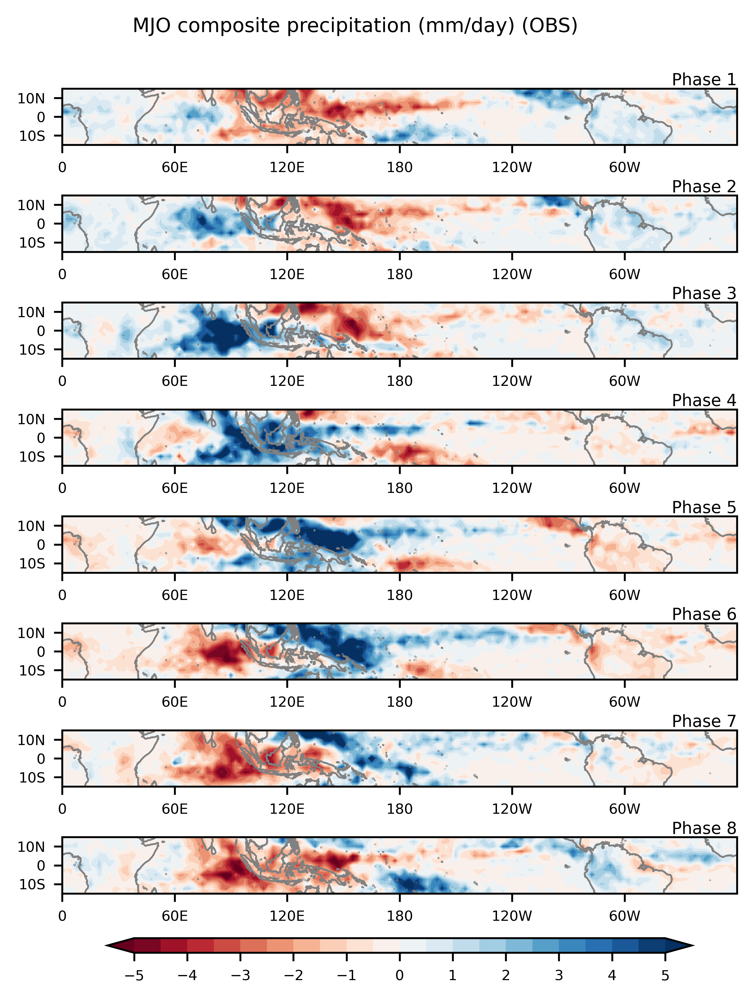

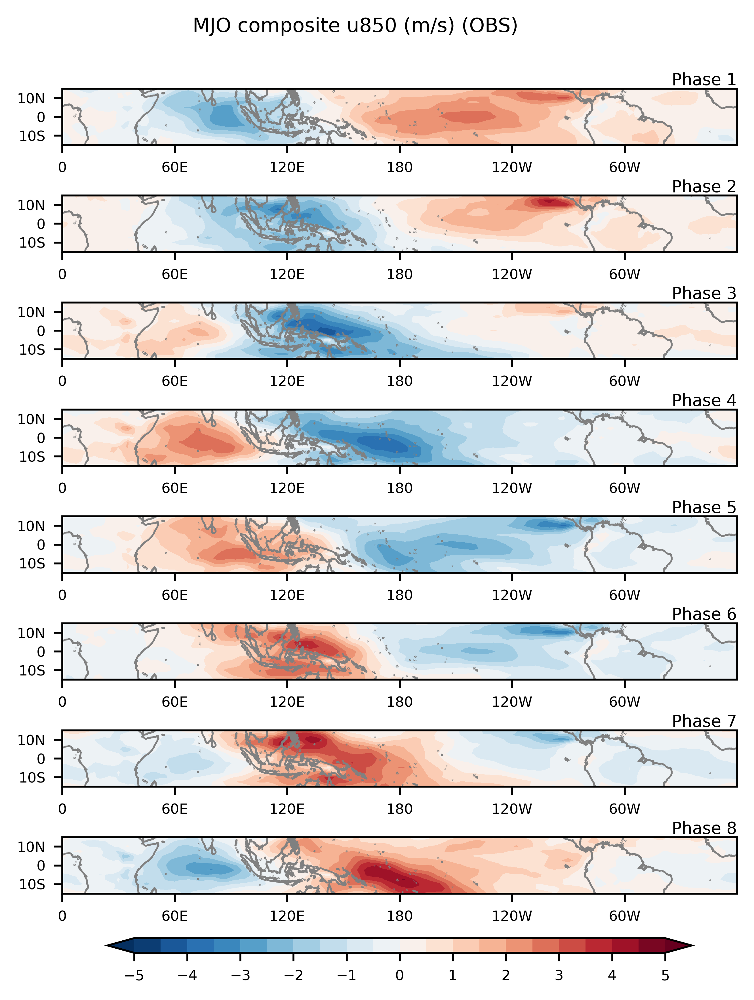

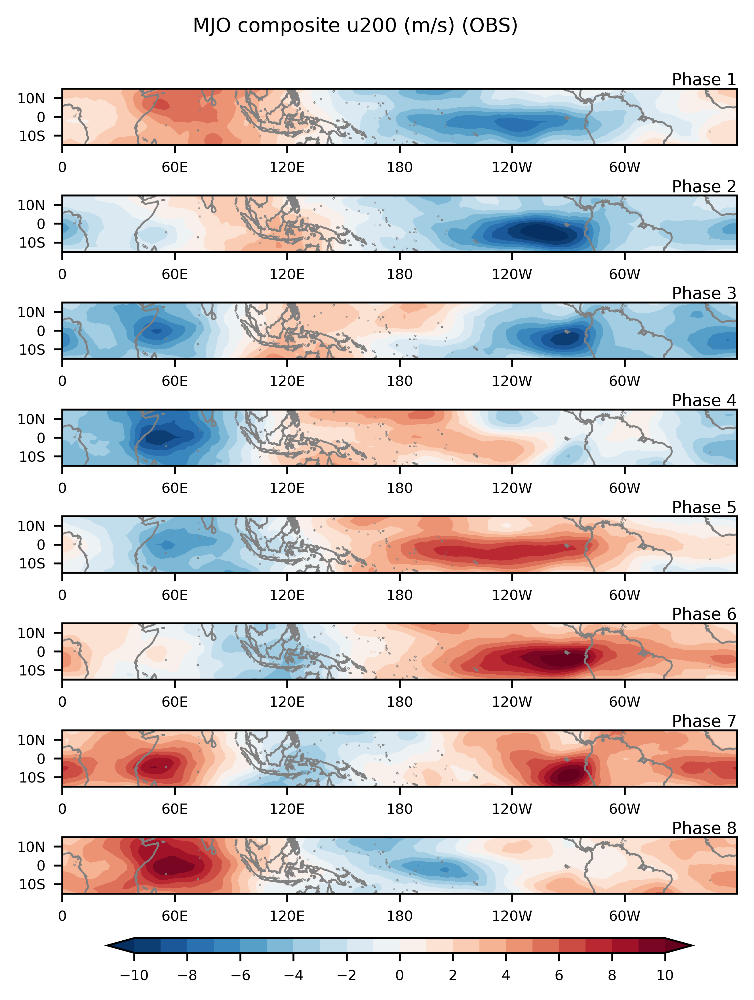

In [59]:
'''
Plot rmm 8-phases composite: olr, u850, u200
'''

vname_long = list(['precipitation (mm/day)','u850 (m/s)','u200 (m/s)'])
vname = list(['pr','u850','u200'])
model_name = 'ERA5'
cmap_list = list(['RdBu','RdBu_r','RdBu_r'])

# Set Contour Level
clev1 = np.arange(-5,5.5,0.5) # pr
cticks1 = np.arange(-5,6,1)
clev2 = np.arange(-5,5.5,0.5) # u850
cticks2 = np.arange(-5,6,1) 
clev3 = np.arange(-10, 11, 1) # u200
cticks3 = np.arange(-10, 12, 2) 

for v in range(0,3):#np.size(vname)):  
    v_in = globals()[vname[v]+'_8ph'] 
    clev = globals()['clev'+str(v+1)]
    cticks = globals()['cticks'+str(v+1)]
    if v == 0: #moisture/pr (blue positive, red negative)
        cbar = "RdBu"
    else:
        cbar = "RdBu_r"

    fig_name = 'Fig.1_MJO_8phase_composite_'+vname[v]+'.png'       
                
    fig, axes = plt.subplots(8,1,figsize=(6.5, 7),dpi=600, subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)} )
    plt.subplots_adjust(left=0.1, right=0.98,top=0.9,bottom=0.15,hspace=0.9, wspace=0.1)
    plt.rcParams.update({'font.size': 7})

    for iplt in range(0,8): # Each phase
        plt.subplot(8,1, iplt+1)
        ax = plt.gca()

        V_tmp = v_in[iplt,:,:]
        lon_tmp = lon
        lat_tmp = lat

        #print(lon_tmp)
        [xx, yy] = np.meshgrid(lon_tmp, lat_tmp)        
        
        # Handle the data to prevent white line
        [V_tmp_cyclic, lon_cyclic] = cartopy_util.add_cyclic_point(
            V_tmp.T, 
            coord=lon_tmp,
            axis=0
        )

        ax.coastlines(color='grey', linewidth=0.75)
        ax.set_xticks(np.arange(0,360,60), crs=ccrs.PlateCarree())
        ax.set_yticks(np.arange(-10,20,10), crs=ccrs.PlateCarree())
        ax.set_xticklabels(['0', '60E', '120E', '180', '120W', '60W'], fontsize=6)
        ax.set_yticklabels(['10S', '0', '10N'], fontsize=6)

        # Plot the data
        contour = plt.contourf(
            lon_cyclic, lat_tmp, V_tmp_cyclic.T, cmap=cmap_list[v],
            transform=ccrs.PlateCarree(), levels= clev, extend='both'
        )

        ax.set_title('Phase '+str(iplt+1), pad=1,loc='right',fontsize=7)
    
    plt.suptitle('MJO composite '+vname_long[v]+' (OBS)', y=0.96)

    cb = fig.colorbar(contour, ax=axes[:], orientation='horizontal',shrink=0.6, fraction=0.05, pad=0.05, aspect=40)           
    cb.ax.tick_params(labelsize=6)
    cb.set_ticks(cticks)    
    plt.savefig(fig_dir_era5+fig_name,format='png', dpi=600) # Change this to be fig_dir_ace2 if using ace data
    plt.show() 
    plt.close()

# Find TC genesis number and the actual location for each basin for each MJO phase

In [12]:
####################
# Function 1 to convert timestamp to hours since Unix epoch
def timestamp_to_hours_since_epoch(timestamp_str, yr_start=2001):
    # Parse the timestamp up to seconds
    datetime_obj = datetime.strptime(timestamp_str[:19], '%Y-%m-%dT%H:%M:%S')
    datetime_obj = datetime_obj.replace(tzinfo=timezone.utc)

    # Define the Unix epoch
    epoch = datetime(yr_start, 1, 1, tzinfo=timezone.utc)

    # Calculate the difference in hours
    hours_since_epoch = (datetime_obj - epoch).total_seconds() / 3600
    return hours_since_epoch

#######################
# Function 2 to convert timestamp to hours since Unix epoch
def timestamp_to_hours_since_epoch2(timestamp, yr_start=2001):

    # Convert numpy.datetime64 to a Python datetime object
    if isinstance(timestamp, np.datetime64):
        datetime_obj = timestamp.astype('datetime64[s]').tolist()
    else:
        return None  # Handle the case if the object is not a valid datetime64 instance
    
    # Convert to UTC timezone
    datetime_obj = datetime_obj.replace(tzinfo=timezone.utc)
    
    # Define the Unix epoch
    epoch = datetime(yr_start, 1, 1, tzinfo=timezone.utc)
    
    # Calculate the difference in hours
    hours_since_epoch = (datetime_obj - epoch).total_seconds() / 3600
    return hours_since_epoch

In [13]:
# For each TC genesis event, find the corresponding MJO phase and the basin

# Load TC genesis event between 30S-30N
data = np.load(dir_in_era5_TC+'TC_genesis_era5_2001-2010_1deg_30SN.npz')
lon_TC = data['lon_TC']
lat_TC = data['lat_TC']
yr_TC  = data['yr']
mon_TC = data['mon']
day_TC = data['day']
hr_TC  = data['hr']

    
# Transform time data in TC into the same format as time_phase_ace2

# Import numpy arrays of date information from TC, convert to int
yr = yr_TC.astype(int)
mon = mon_TC.astype(int)
day = day_TC.astype(int)
hr = hr_TC.astype(int)

# Create an empty list to store datetime strings
datetime_strings_TC = []

# Loop through the arrays to format as ISO 8601 strings
for y, m, d, h in zip(yr, mon, day, hr):
    dt = datetime(y, m, d, h)  # Create a datetime object
    datetime_strings_TC.append(dt.strftime('%Y-%m-%dT%H:%M:%S'))  # Format as ISO 8601

# Convert to hours since 2001-01-01:00
hours_since_2001_TC = [timestamp_to_hours_since_epoch(ts) for ts in datetime_strings_TC]

In [17]:
# Transform time data from MJO
hours_since_2001_MJO = np.arange(0, 6*np.size(time), 6) # Remember to change this when using ACE2!

# Find the MJO phase for each TC genesis event
TC_MJO_phase = np.empty([np.size(lon_TC)])
for i in range(0, np.size(lon_TC)):
    it = np.argwhere(hours_since_2001_MJO == hours_since_2001_TC[i])
    TC_MJO_phase[i] = MJO_phase_timeseries[it]

/tmp/ipykernel_991532/348950901.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  TC_MJO_phase[i] = MJO_phase_timeseries[it]


In [18]:
print(TC_MJO_phase[:10])

[nan nan nan  4.  4.  5.  6.  7.  7.  7.]


In [12]:
# Save TC genesis data for each MJO phase

save_lon_lat_genesis = 0 

if save_lon_lat_genesis == 1:

    lon_TC_phase1 = np.where(TC_MJO_phase==1, lon_TC, np.nan)
    lat_TC_phase1 = np.where(TC_MJO_phase==1, lat_TC, np.nan)
    lon_TC_phase1 = lon_TC_phase1[~np.isnan(lon_TC_phase1)]
    lat_TC_phase1 = lat_TC_phase1[~np.isnan(lat_TC_phase1)]
    #
    lon_TC_phase2 = np.where(TC_MJO_phase==2, lon_TC, np.nan)
    lat_TC_phase2 = np.where(TC_MJO_phase==2, lat_TC, np.nan)
    lon_TC_phase2 = lon_TC_phase2[~np.isnan(lon_TC_phase2)]
    lat_TC_phase2 = lat_TC_phase2[~np.isnan(lat_TC_phase2)]
    #
    lon_TC_phase3 = np.where(TC_MJO_phase==3, lon_TC, np.nan)
    lat_TC_phase3 = np.where(TC_MJO_phase==3, lat_TC, np.nan)
    lon_TC_phase3 = lon_TC_phase3[~np.isnan(lon_TC_phase3)]
    lat_TC_phase3 = lat_TC_phase3[~np.isnan(lat_TC_phase3)]
    #
    lon_TC_phase4 = np.where(TC_MJO_phase==4, lon_TC, np.nan)
    lat_TC_phase4 = np.where(TC_MJO_phase==4, lat_TC, np.nan)
    lon_TC_phase4 = lon_TC_phase4[~np.isnan(lon_TC_phase4)]
    lat_TC_phase4 = lat_TC_phase4[~np.isnan(lat_TC_phase4)]
    #
    lon_TC_phase5 = np.where(TC_MJO_phase==5, lon_TC, np.nan)
    lat_TC_phase5 = np.where(TC_MJO_phase==5, lat_TC, np.nan)
    lon_TC_phase5 = lon_TC_phase5[~np.isnan(lon_TC_phase5)]
    lat_TC_phase5 = lat_TC_phase5[~np.isnan(lat_TC_phase5)]
    #
    lon_TC_phase6 = np.where(TC_MJO_phase==6, lon_TC, np.nan)
    lat_TC_phase6 = np.where(TC_MJO_phase==6, lat_TC, np.nan)
    lon_TC_phase6 = lon_TC_phase6[~np.isnan(lon_TC_phase6)]
    lat_TC_phase6 = lat_TC_phase6[~np.isnan(lat_TC_phase6)]
    #
    lon_TC_phase7 = np.where(TC_MJO_phase==7, lon_TC, np.nan)
    lat_TC_phase7 = np.where(TC_MJO_phase==7, lat_TC, np.nan)
    lon_TC_phase7 = lon_TC_phase7[~np.isnan(lon_TC_phase7)]
    lat_TC_phase7 = lat_TC_phase7[~np.isnan(lat_TC_phase7)]
    #
    lon_TC_phase8 = np.where(TC_MJO_phase==8, lon_TC, np.nan)
    lat_TC_phase8 = np.where(TC_MJO_phase==8, lat_TC, np.nan)
    lon_TC_phase8 = lon_TC_phase8[~np.isnan(lon_TC_phase8)]
    lat_TC_phase8 = lat_TC_phase8[~np.isnan(lat_TC_phase8)]


    output2 = file_dir_out+'TC_genesis_lon_lat_8phase_ERA5_2001_2010.npz'
    np.savez(output2, lon_TC_phase1=lon_TC_phase1, lat_TC_phase1=lat_TC_phase1,\
            lon_TC_phase2=lon_TC_phase2, lat_TC_phase2=lat_TC_phase2,\
            lon_TC_phase3=lon_TC_phase3, lat_TC_phase3=lat_TC_phase3,\
            lon_TC_phase4=lon_TC_phase4, lat_TC_phase4=lat_TC_phase4,\
            lon_TC_phase5=lon_TC_phase5, lat_TC_phase5=lat_TC_phase5,\
            lon_TC_phase6=lon_TC_phase6, lat_TC_phase6=lat_TC_phase6,\
            lon_TC_phase7=lon_TC_phase7, lat_TC_phase7=lat_TC_phase7,\
            lon_TC_phase8=lon_TC_phase8, lat_TC_phase8=lat_TC_phase8)
else:
    data = np.load(file_dir_out+'TC_genesis_lon_lat_8phase_ERA5_2001_2010.npz')
    lon_TC_phase1 = data['lon_TC_phase1']
    lon_TC_phase2 = data['lon_TC_phase2']
    lon_TC_phase3 = data['lon_TC_phase3']    
    lon_TC_phase4 = data['lon_TC_phase4']
    lon_TC_phase5 = data['lon_TC_phase5']
    lon_TC_phase6 = data['lon_TC_phase6']
    lon_TC_phase7 = data['lon_TC_phase7']
    lon_TC_phase8 = data['lon_TC_phase8']
    #
    lat_TC_phase1 = data['lat_TC_phase1']
    lat_TC_phase2 = data['lat_TC_phase2']
    lat_TC_phase3 = data['lat_TC_phase3']    
    lat_TC_phase4 = data['lat_TC_phase4']
    lat_TC_phase5 = data['lat_TC_phase5']
    lat_TC_phase6 = data['lat_TC_phase6']
    lat_TC_phase7 = data['lat_TC_phase7']
    lat_TC_phase8 = data['lat_TC_phase8']

In [25]:
print(lat_TC_phase1)

[ -9.  13.  25.  27.  15. -12.  12.  15.  14.  10.  13. -16.   7.  28.
  15.  19.  30.  25. -18.  14.  15.  24.  16.  19.  14.  13.  16.  14.
 -17.  16.  17.  16.   9. -13.  15.]


# Save TC genesis month for each MJO phase (this is used to separate season later on)
2025.3.2

In [8]:
# Save TC genesis data for each MJO phase
save_mon_TC = 0
if save_mon_TC == 1:
    mon_TC_phase1 = np.where(TC_MJO_phase==1, mon_TC, np.nan)
    mon_TC_phase1 = mon_TC_phase1[~np.isnan(mon_TC_phase1)]
    #
    mon_TC_phase2 = np.where(TC_MJO_phase==2, mon_TC, np.nan)
    mon_TC_phase2 = mon_TC_phase2[~np.isnan(mon_TC_phase2)]
    #
    mon_TC_phase3 = np.where(TC_MJO_phase==3, mon_TC, np.nan)
    mon_TC_phase3 = mon_TC_phase3[~np.isnan(mon_TC_phase3)]
    #
    mon_TC_phase4 = np.where(TC_MJO_phase==4, mon_TC, np.nan)
    mon_TC_phase4 = mon_TC_phase4[~np.isnan(mon_TC_phase4)]
    #
    mon_TC_phase5 = np.where(TC_MJO_phase==5, mon_TC, np.nan)
    mon_TC_phase5 = mon_TC_phase5[~np.isnan(mon_TC_phase5)]
    #
    mon_TC_phase6 = np.where(TC_MJO_phase==6, mon_TC, np.nan)
    mon_TC_phase6 = mon_TC_phase6[~np.isnan(mon_TC_phase6)]
    #
    mon_TC_phase7 = np.where(TC_MJO_phase==7, mon_TC, np.nan)
    mon_TC_phase7 = mon_TC_phase7[~np.isnan(mon_TC_phase7)]
    #
    mon_TC_phase8 = np.where(TC_MJO_phase==8, mon_TC, np.nan)
    mon_TC_phase8 = mon_TC_phase8[~np.isnan(mon_TC_phase8)]


    output2 = file_dir_out+'TC_genesis_month_8phase_ERA5_2001_2010.npz'
    np.savez(output2, mon_TC_phase1=mon_TC_phase1,\
            mon_TC_phase2=mon_TC_phase2,\
            mon_TC_phase3=mon_TC_phase3,\
            mon_TC_phase4=mon_TC_phase4,\
            mon_TC_phase5=mon_TC_phase5,\
            mon_TC_phase6=mon_TC_phase6,\
            mon_TC_phase7=mon_TC_phase7,\
            mon_TC_phase8=mon_TC_phase8)
else:
    data = np.load(file_dir_out+'TC_genesis_month_8phase_ERA5_2001_2010.npz')
    mon_TC_phase1 = data['mon_TC_phase1']
    mon_TC_phase2 = data['mon_TC_phase2']
    mon_TC_phase3 = data['mon_TC_phase3']    
    mon_TC_phase4 = data['mon_TC_phase4']
    mon_TC_phase5 = data['mon_TC_phase5']
    mon_TC_phase6 = data['mon_TC_phase6']
    mon_TC_phase7 = data['mon_TC_phase7']
    mon_TC_phase8 = data['mon_TC_phase8']

In [27]:
print(mon_TC_phase8)

[ 3.  5.  8.  8. 12.  1.  1.  1.  2.  7.  8.  8.  8.  9.  9. 10.  4.  5.
  2.  2.  2.  3.  3.  4.  8.  9.  9. 11.  5.  8.  1.  7.  1.  9. 12. 12.
  4.  5.  5. 10. 10. 10. 12.  2.  2.]


# Caculate TC genesis number for each MJO phase for each basin

In [9]:
# Load basin info
basin_list    = list(['NI','NWPAC','NEPAC','NATL','SI','SPAC'])
basin_long_list = list(['North IO','North WestPac','North EastPac','North Atl','South IO','South Pac'])
basin_lon_min = np.array([45, 105, 180, 265, 35, 135])
basin_lon_max = np.array([105, 180, 265, 357.5, 135, 270])
latmax = 30 #25 is not used, use 30
basin_lat_min = np.array([0,    0,    0,  0,  -latmax, -latmax])
basin_lat_max = np.array([latmax,  latmax, latmax, latmax,    0, 0])
nbasin        = np.size(basin_list)

In [16]:
# Use all-year data
calc_TC_genesis_phase_basin = 0

if calc_TC_genesis_phase_basin == 1:
    nphase = 8
    TC_genesis_MJO_phase_basin = np.zeros([nphase, nbasin])

    for iph in range(0, nphase):
        lon_tmp = globals()['lon_TC_phase'+str(iph+1)]
        lat_tmp = globals()['lat_TC_phase'+str(iph+1)]
        for i in range(0, np.size(lon_tmp)):
            for ibasin in range(0, nbasin):
                dlonmin = lon_tmp[i]-basin_lon_min[ibasin]
                dlonmax = lon_tmp[i]-basin_lon_max[ibasin]
                dlatmin = lat_tmp[i]-basin_lat_min[ibasin]
                dlatmax = lat_tmp[i]-basin_lat_max[ibasin]
                #print(dlonmin, dlonmax, dlatmin, dlatmax)
                if dlonmin*dlonmax < 0 and dlatmin*dlatmax <0:
                    TC_genesis_MJO_phase_basin[iph, ibasin] = TC_genesis_MJO_phase_basin[iph, ibasin] + 1
                    #print(ibasin)
                    continue

    # Save TC genesis number for 8 phases for each basin
    output2 = file_dir_out+'TC_genesis_number_8phase_basin_ERA5_2001_2010.npz'
    np.savez(output2, TC_genesis_MJO_phase_basin=TC_genesis_MJO_phase_basin, phase=np.arange(1,9),basin_list=basin_list)
else:
    data = np.load(file_dir_out+'TC_genesis_number_8phase_basin_ERA5_2001_2010.npz')
    TC_genesis_MJO_phase_basin = data['TC_genesis_MJO_phase_basin']

In [17]:
# Use only summer season data (NH: May-Oct, SH: Nov-April)
# Updated 2025.3.2

calc_TC_genesis_phase_basin_summer = 0

if calc_TC_genesis_phase_basin_summer == 1:
    nphase = 8
    TC_genesis_MJO_phase_basin = np.zeros([nphase, nbasin])

    for iph in range(0, nphase):
        lon_tmp = globals()['lon_TC_phase'+str(iph+1)]
        lat_tmp = globals()['lat_TC_phase'+str(iph+1)]
        mon_tmp = globals()['mon_TC_phase'+str(iph+1)]
        for i in range(0, np.size(lon_tmp)):
            for ibasin in range(0, nbasin):
                dlonmin = lon_tmp[i]-basin_lon_min[ibasin]
                dlonmax = lon_tmp[i]-basin_lon_max[ibasin]
                dlatmin = lat_tmp[i]-basin_lat_min[ibasin]
                dlatmax = lat_tmp[i]-basin_lat_max[ibasin]
                #print(dlonmin, dlonmax, dlatmin, dlatmax)
                if dlonmin*dlonmax < 0 and dlatmin*dlatmax <0:
                    if lat_tmp[i] > 0 and mon_tmp[i] <=10 and mon_tmp[i]>=5:
                        TC_genesis_MJO_phase_basin[iph, ibasin] = TC_genesis_MJO_phase_basin[iph, ibasin] + 1
                        #print(ibasin)
                        continue
                    elif lat_tmp[i] < 0 and (mon_tmp[i] >=11 or mon_tmp[i]<=4):
                        TC_genesis_MJO_phase_basin[iph, ibasin] = TC_genesis_MJO_phase_basin[iph, ibasin] + 1
                        #print(ibasin)
                        continue

    # Save TC genesis number for 8 phases for each basin
    output2 = file_dir_out+'TC_genesis_number_8phase_basin_ERA5_2001_2010_summer_only.npz'
    np.savez(output2, TC_genesis_MJO_phase_basin=TC_genesis_MJO_phase_basin, phase=np.arange(1,9),basin_list=basin_list)
else:
    data = np.load(file_dir_out+'TC_genesis_number_8phase_basin_ERA5_2001_2010_summer_only.npz')
    TC_genesis_MJO_phase_basin = data['TC_genesis_MJO_phase_basin']

# Plot TC genesis for each MJO phase for each basin

In [44]:
print(basin_list)

['NI', 'NWPAC', 'NEPAC', 'NATL', 'SI', 'SPAC']


In [18]:
# Calculate anomalous TC genesis for each basin
TC_genesis_MJO_phase_basin_ano = TC_genesis_MJO_phase_basin - np.mean(TC_genesis_MJO_phase_basin, 0)

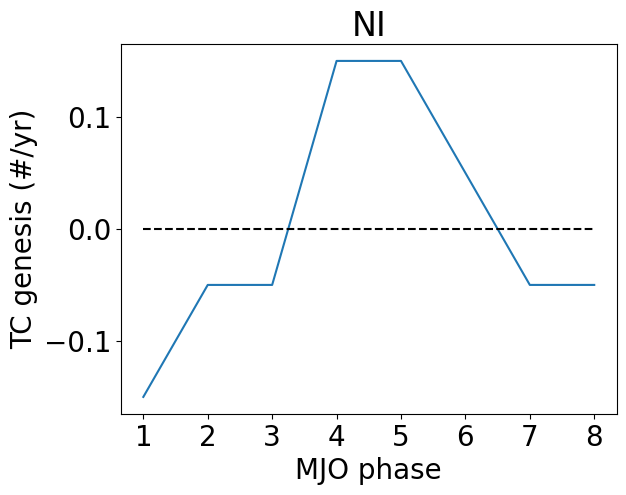

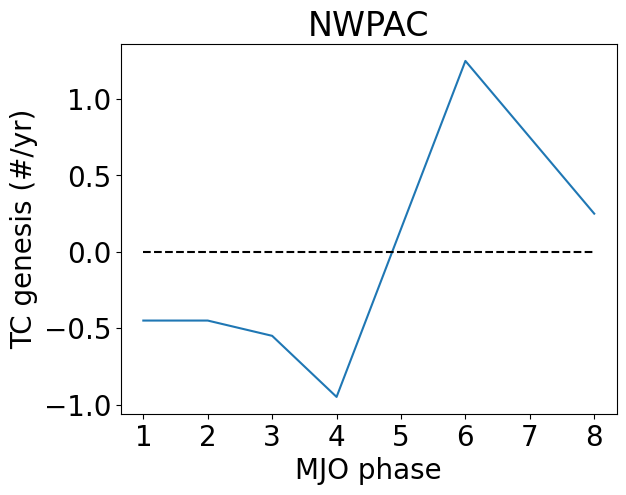

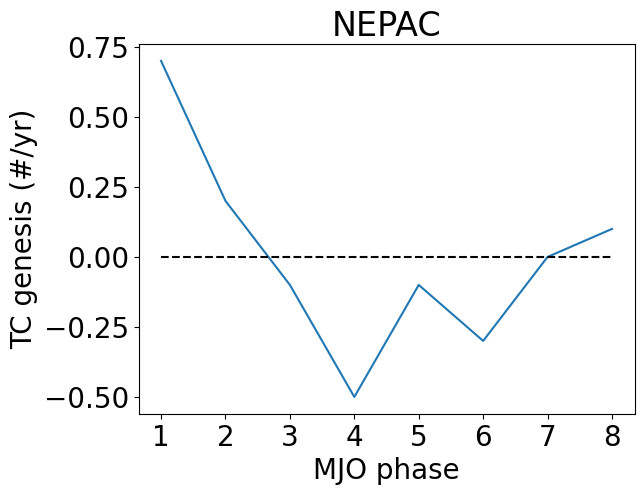

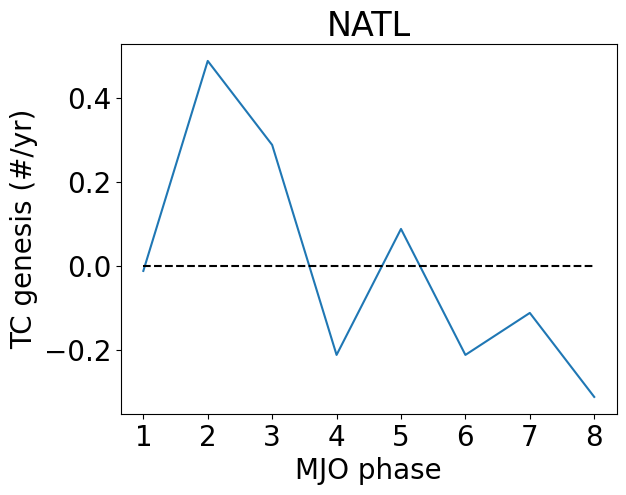

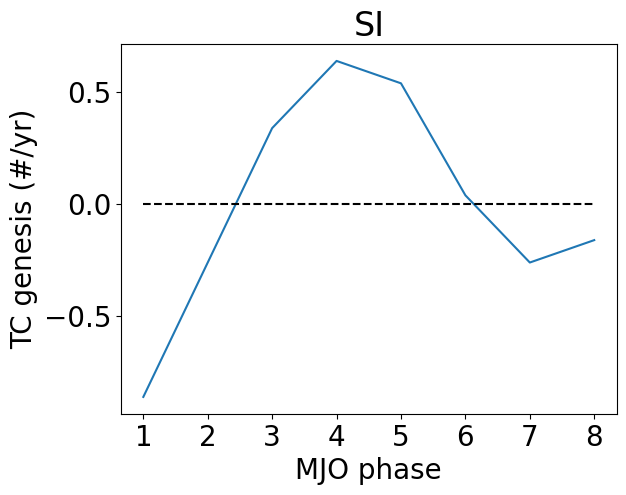

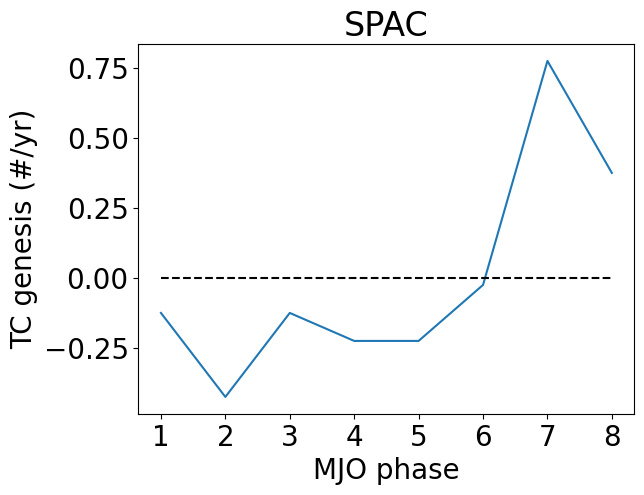

In [20]:
# Plot TC genesis modulated by MJO for each basin
nphase = 8
for ibasin in range(0, nbasin):
    zeros = np.zeros([nphase])
    phase = np.arange(1,9)
    plt.plot(phase, TC_genesis_MJO_phase_basin_ano[:,ibasin]/10)
    plt.plot(phase, zeros, 'k--')
    plt.title(basin_list[ibasin])
    plt.xticks(phase)
    plt.xlabel('MJO phase')
    plt.ylabel('TC genesis (#/yr)')
    plt.show()

# Load TCGI, calculate MJO composite TCGI

In [21]:
# Load TCGI

file_dir_TCGI_in = DIR + 'data_output/ERA5_TCGI/' # input and output directory
file_name = 'TCGI_ERA5_2001_2010_2.5deg_6h_ano.nc'
ds = xr.open_dataset(file_dir_TCGI_in + file_name)
TCGI_ano = ds['TCGI_ano']*12/40
time_TCGI = ds['time']
lat_TCGI = ds['lat'].values
lon_TCGI = ds['lon'].values

print(np.sum(time_TCGI-time))

<xarray.DataArray 'time' ()> Size: 8B
array(0, dtype='timedelta64[ns]')


In [32]:
print(time)

['2001-01-01T00:00:00.000000000' '2001-01-01T06:00:00.000000000'
 '2001-01-01T12:00:00.000000000' ... '2010-12-30T06:00:00.000000000'
 '2010-12-30T12:00:00.000000000' '2010-12-30T18:00:00.000000000']


In [24]:
# MJO phase composite TCGI (all year)
mjo_tgci = 0
if mjo_tgci == 1:
    TCGI_8ph = MJO.eight_phase_composite(TCGI_ano[:,:,:],RMM_ind)   
        
    # Save output
    output2 = file_dir_out+'MJO_8ph_composite_ERA5_2001_2010.npz'
    np.savez(output2, u850_8ph = u850_8ph, u200_8ph = u200_8ph, pr_8ph = pr_8ph, TCGI_8ph=TCGI_8ph,\
                    RMM_ind = RMM_ind, 
                    pr_8ph_rms = pr_8ph_rms, u850_8ph_rms = u850_8ph_rms, u200_8ph_rms = u200_8ph_rms, \
                    time = time, lon = lon, lat = lat, lat_TCGI=lat_TCGI) 
else:
    data = np.load(file_dir_out+'MJO_8ph_composite_ERA5_2001_2010.npz')
    TCGI_8ph = data['TCGI_8ph']

In [36]:
# MJO phase composite TCGI (summer only)
# Updated 2025.3.2

calc_TCGI_summer = 0

if calc_TCGI_summer == 1:
    ds = xr.open_dataset(file_dir_TCGI_in + file_name)
    TCGI_ano = ds['TCGI_ano']*12/40
    time_TCGI = ds['time']
    lat_TCGI = ds['lat'].values
    lon_TCGI = ds['lon'].values

    import pandas as pd
    month_TCGI = pd.to_datetime(time_TCGI).month

    # Construct an index to determine if this is MJJASO or NDJFMA
    month_TCGI_tmp = month_TCGI - 5
    month_TCGI_tmp = np.where(month_TCGI_tmp<0, month_TCGI_tmp+12, month_TCGI_tmp)

    time_idx_MJJASO = np.argwhere(month_TCGI_tmp<=5).squeeze()
    time_idx_NDJFMA = np.argwhere(month_TCGI_tmp>5).squeeze()
    #print(time_idx_MJJASO)
    #print(time_idx_NDJFMA)


    # If month_TCGI_tmp <=5: MJJASO, else: NDJFMA
    TCGI_ano_MJJASO = TCGI_ano[time_idx_MJJASO, :, :]
    TCGI_ano_NDJFMA = TCGI_ano[time_idx_NDJFMA, :, :]


    # Recalculate RMM index based on season
    n_MJJASO,RMM_ind_MJJASO,rmm1_norm_MJJASO,rmm2_norm_MJJASO = MJO.rmm_eight_phase_index(rmm1[time_idx_MJJASO],rmm2[time_idx_MJJASO],time[time_idx_MJJASO],\
                                                                                        rmm1[time_idx_MJJASO],rmm2[time_idx_MJJASO])

    n_NDJFMA,RMM_ind_NDJFMA,rmm1_norm_NDJFMA,rmm2_norm_NDJFMA = MJO.rmm_eight_phase_index(rmm1[time_idx_NDJFMA],rmm2[time_idx_NDJFMA],time[time_idx_NDJFMA],\
                                                                                        rmm1[time_idx_NDJFMA],rmm2[time_idx_NDJFMA])

    # Recalculate MJO composite based on season
    TCGI_8ph_MJJASO = MJO.eight_phase_composite(TCGI_ano_MJJASO[:,:,:], RMM_ind_MJJASO)   
    TCGI_8ph_NDJFMA = MJO.eight_phase_composite(TCGI_ano_NDJFMA[:,:,:], RMM_ind_NDJFMA)   

    # Save composite TCGI
    output2 = file_dir_out+'MJO_8ph_composite_TCGI_ERA5_2001_2010_summer.npz'
    np.savez(output2, TCGI_8ph_MJJASO=TCGI_8ph_MJJASO, TCGI_8ph_NDJFMA=TCGI_8ph_NDJFMA,\
            n_MJJASO=n_MJJASO, n_NDJFMA=n_NDJFMA, RMM_ind_MJJASO=RMM_ind_MJJASO, RMM_ind_NDJFMA=RMM_ind_NDJFMA,\
                rmm1_norm_MJJASO=rmm1_norm_MJJASO, rmm2_norm_MJJASO=rmm2_norm_MJJASO,\
                rmm1_norm_NDJFMA=rmm1_norm_NDJFMA, rmm2_norm_NDJFMA=rmm2_norm_NDJFMA, lon=lon, lat=lat_TCGI)

else:
    data = np.load(file_dir_out+'MJO_8ph_composite_TCGI_ERA5_2001_2010_summer.npz')
    TCGI_8ph_MJJASO = data['TCGI_8ph_MJJASO']
    TCGI_8ph_NDJFMA = data['TCGI_8ph_NDJFMA']
    lon             = data['lon']
    lat_TCGI        = data['lat_TCGI']
    n_MJJASO        = data['n_MJJASO']
    n_NDJFMA        = data['n_NDJMFA']

In [34]:
print(file_dir_out)

/barnes-engr-scratch1/c832572266/data_output/ace2/obs_compare_with_ace2/MJO/


In [26]:
# Separate TC data by season

for iph in range(1, 9):

    mon_TC_tmp = globals()['mon_TC_phase'+str(iph)]
    mon_TC_tmp = mon_TC_tmp - 5
    mon_TC_tmp = np.where(mon_TC_tmp<0, mon_TC_tmp+12, mon_TC_tmp)

    lon_TC_tmp = globals()['lon_TC_phase'+str(iph)]
    lat_TC_tmp = globals()['lat_TC_phase'+str(iph)]

    tmp = np.where(mon_TC_tmp<=5, lon_TC_tmp, np.nan) # MJJASO
    tmp2 = np.where(mon_TC_tmp<=5, lat_TC_tmp, np.nan)
    tmp3 = np.where(mon_TC_tmp>5, lon_TC_tmp, np.nan) # NDJFMA
    tmp4 = np.where(mon_TC_tmp>5, lat_TC_tmp, np.nan)

    if iph == 1:
        lon_TC_phase1_MJJASO = tmp[np.isnan(tmp)==0]
        lat_TC_phase1_MJJASO = tmp2[np.isnan(tmp2)==0]
        lon_TC_phase1_NDJFMA = tmp3[np.isnan(tmp3)==0]
        lat_TC_phase1_NDJFMA = tmp4[np.isnan(tmp4)==0]
    elif iph == 2:
        lon_TC_phase2_MJJASO = tmp[np.isnan(tmp)==0]
        lat_TC_phase2_MJJASO = tmp2[np.isnan(tmp2)==0]
        lon_TC_phase2_NDJFMA = tmp3[np.isnan(tmp3)==0]
        lat_TC_phase2_NDJFMA = tmp4[np.isnan(tmp4)==0]
    elif iph == 3:
        lon_TC_phase3_MJJASO = tmp[np.isnan(tmp)==0]
        lat_TC_phase3_MJJASO = tmp2[np.isnan(tmp2)==0]
        lon_TC_phase3_NDJFMA = tmp3[np.isnan(tmp3)==0]
        lat_TC_phase3_NDJFMA = tmp4[np.isnan(tmp4)==0]
    elif iph == 4:
        lon_TC_phase4_MJJASO = tmp[np.isnan(tmp)==0]
        lat_TC_phase4_MJJASO = tmp2[np.isnan(tmp2)==0]
        lon_TC_phase4_NDJFMA = tmp3[np.isnan(tmp3)==0]
        lat_TC_phase4_NDJFMA = tmp4[np.isnan(tmp4)==0]
    elif iph == 5:
        lon_TC_phase5_MJJASO = tmp[np.isnan(tmp)==0]
        lat_TC_phase5_MJJASO = tmp2[np.isnan(tmp2)==0]
        lon_TC_phase5_NDJFMA = tmp3[np.isnan(tmp3)==0]
        lat_TC_phase5_NDJFMA = tmp4[np.isnan(tmp4)==0]
    elif iph == 6:
        lon_TC_phase6_MJJASO = tmp[np.isnan(tmp)==0]
        lat_TC_phase6_MJJASO = tmp2[np.isnan(tmp2)==0]
        lon_TC_phase6_NDJFMA = tmp3[np.isnan(tmp3)==0]
        lat_TC_phase6_NDJFMA = tmp4[np.isnan(tmp4)==0]
    elif iph == 7:
        lon_TC_phase7_MJJASO = tmp[np.isnan(tmp)==0]
        lat_TC_phase7_MJJASO = tmp2[np.isnan(tmp2)==0]
        lon_TC_phase7_NDJFMA = tmp3[np.isnan(tmp3)==0]
        lat_TC_phase7_NDJFMA = tmp4[np.isnan(tmp4)==0]
    elif iph == 8:
        lon_TC_phase8_MJJASO = tmp[np.isnan(tmp)==0]
        lat_TC_phase8_MJJASO = tmp2[np.isnan(tmp2)==0]  
        lon_TC_phase8_NDJFMA = tmp3[np.isnan(tmp3)==0]
        lat_TC_phase8_NDJFMA = tmp4[np.isnan(tmp4)==0] 

# Save TC genesis data for each MJO phase (summer only)
output2 = file_dir_out+'MJO_8ph_TCgenesis_location_ERA5_2001_2010_MJJASO.npz'
np.savez(output2, lon_TC_phase1_MJJASO=lon_TC_phase1_MJJASO, lat_TC_phase1_MJJASO=lat_TC_phase1_MJJASO,\
        lon_TC_phase2_MJJASO=lon_TC_phase2_MJJASO, lat_TC_phase2_MJJASO=lat_TC_phase2_MJJASO,\
        lon_TC_phase3_MJJASO=lon_TC_phase3_MJJASO, lat_TC_phase3_MJJASO=lat_TC_phase3_MJJASO,\
        lon_TC_phase4_MJJASO=lon_TC_phase4_MJJASO, lat_TC_phase4_MJJASO=lat_TC_phase4_MJJASO,\
        lon_TC_phase5_MJJASO=lon_TC_phase5_MJJASO, lat_TC_phase5_MJJASO=lat_TC_phase5_MJJASO,\
        lon_TC_phase6_MJJASO=lon_TC_phase6_MJJASO, lat_TC_phase6_MJJASO=lat_TC_phase6_MJJASO,\
        lon_TC_phase7_MJJASO=lon_TC_phase7_MJJASO, lat_TC_phase7_MJJASO=lat_TC_phase7_MJJASO,\
        lon_TC_phase8_MJJASO=lon_TC_phase8_MJJASO, lat_TC_phase8_MJJASO=lat_TC_phase8_MJJASO)

output2 = file_dir_out+'MJO_8ph_TCgenesis_location_ERA5_2001_2010_NDJFMA.npz'
np.savez(output2, lon_TC_phase1_NDJFMA=lon_TC_phase1_NDJFMA, lat_TC_phase1_NDJFMA=lat_TC_phase1_NDJFMA,\
        lon_TC_phase2_NDJFMA=lon_TC_phase2_NDJFMA, lat_TC_phase2_NDJFMA=lat_TC_phase2_NDJFMA,\
        lon_TC_phase3_NDJFMA=lon_TC_phase3_NDJFMA, lat_TC_phase3_NDJFMA=lat_TC_phase3_NDJFMA,\
        lon_TC_phase4_NDJFMA=lon_TC_phase4_NDJFMA, lat_TC_phase4_NDJFMA=lat_TC_phase4_NDJFMA,\
        lon_TC_phase5_NDJFMA=lon_TC_phase5_NDJFMA, lat_TC_phase5_NDJFMA=lat_TC_phase5_NDJFMA,\
        lon_TC_phase6_NDJFMA=lon_TC_phase6_NDJFMA, lat_TC_phase6_NDJFMA=lat_TC_phase6_NDJFMA,\
        lon_TC_phase7_NDJFMA=lon_TC_phase7_NDJFMA, lat_TC_phase7_NDJFMA=lat_TC_phase7_NDJFMA,\
        lon_TC_phase8_NDJFMA=lon_TC_phase8_NDJFMA, lat_TC_phase8_NDJFMA=lat_TC_phase8_NDJFMA)

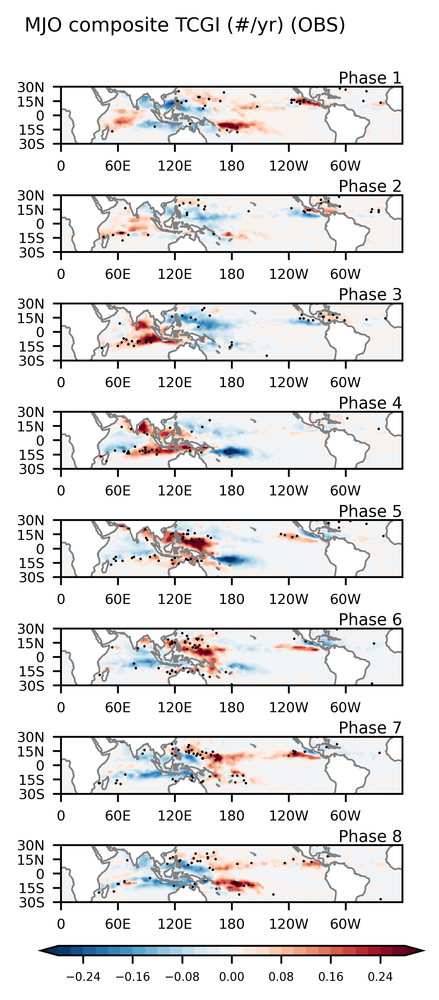

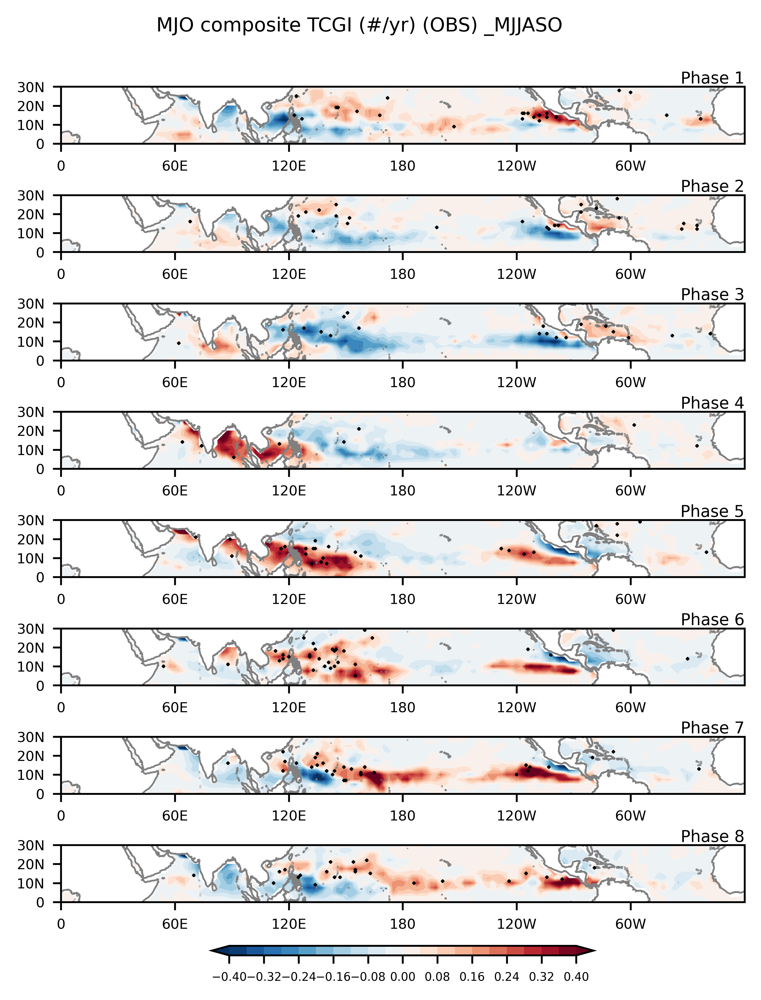

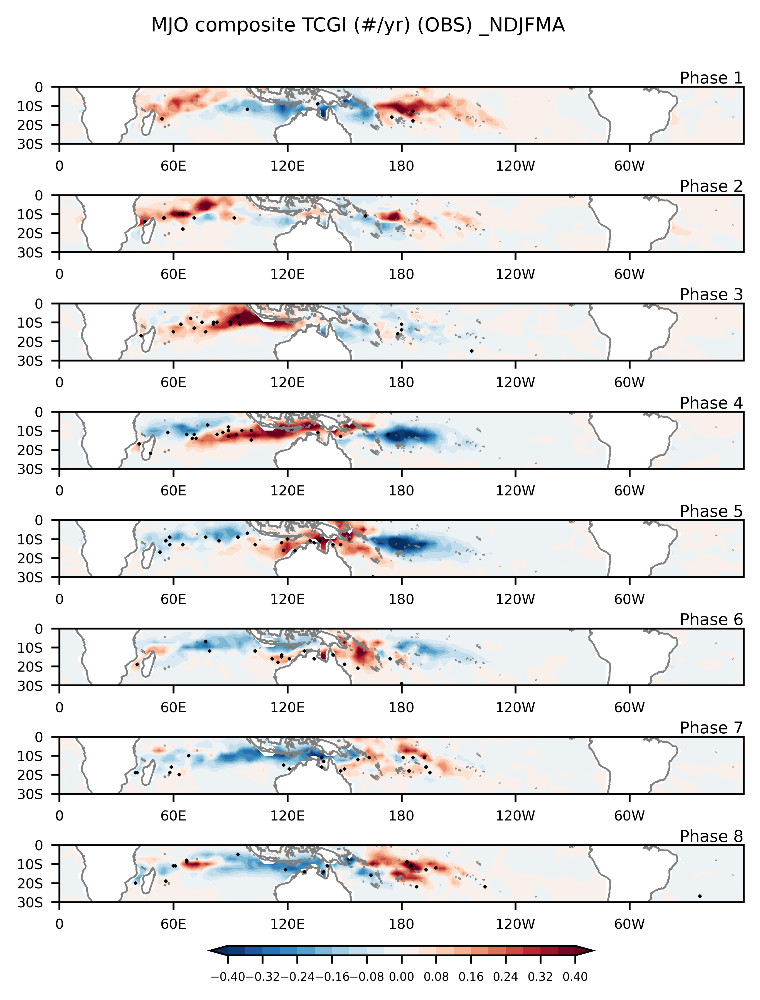

In [66]:
'''
Plot rmm 8-phases composite: TCGI
'''

season_list = list(['','_MJJASO','_NDJFMA'])

vname_long = list(['TCGI (#/yr)'])#precipitation (mm/day)','u850 (m/s)','u200 (m/s)'])
vname = list(['TCGI'])#'pr','u850','u200'])
model_name = 'ERA5'
cmap_list = list(['RdBu_r'])#,'RdBu_r','RdBu_r'])



for isea in range(0, 3):
    for v in range(0,1):#np.size(vname)):  
        v_in = globals()[vname[v]+'_8ph'+season_list[isea]] 

        # Set Contour Level
        if isea == 0:
            clev1 = np.arange(-2.8, 3, 0.2)*0.1 # TCGI
            cticks1 = np.arange(-2.4, 3.2, 0.8)*0.1
        else:
            clev1 = np.arange(-4, 4.4, 0.4)*0.1 # TCGI
            cticks1 = np.arange(-4, 4.8, 0.8)*0.1            

        clev = globals()['clev'+str(v+1)]
        cticks = globals()['cticks'+str(v+1)]

        fig_name = 'Fig.1_MJO_8phase_composite_'+vname[v]+season_list[isea]+'.png'       
                    
        fig, axes = plt.subplots(8,1,figsize=(6.5, 7),dpi=600, subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)} )
        plt.subplots_adjust(left=0.1, right=0.98,top=0.9,bottom=0.15,hspace=0.9, wspace=0.1)
        plt.rcParams.update({'font.size': 7})

        for iplt in range(0,8): # Each phase
            plt.subplot(8,1, iplt+1)
            ax = plt.gca()

            V_tmp = v_in[iplt,:,:]
            lon_tmp = lon
            lat_tmp = lat_TCGI

            #print(lon_tmp)
            [xx, yy] = np.meshgrid(lon_tmp, lat_tmp)        
            
            # Handle the data to prevent white line
            [V_tmp_cyclic, lon_cyclic] = cartopy_util.add_cyclic_point(
                V_tmp.T, 
                coord=lon_tmp,
                axis=0
            )

            ax.coastlines(color='grey', linewidth=0.75)
            ax.set_xticks(np.arange(0,360,60), crs=ccrs.PlateCarree())
            ax.set_xticklabels(['0', '60E', '120E', '180', '120W', '60W'], fontsize=6)
            if isea == 0:
                ax.set_yticks(np.arange(-30,45,15), crs=ccrs.PlateCarree())
                ax.set_yticklabels(['30S','15S', '0','15N','30N'], fontsize=6)
            elif isea == 1:
                ax.set_yticks(np.arange(0,40,10), crs=ccrs.PlateCarree())
                ax.set_yticklabels(['0','10N','20N','30N'], fontsize=6) 
                plt.ylim([0, 30])
            elif isea == 2:
                ax.set_yticks(np.arange(-30,10,10), crs=ccrs.PlateCarree())
                ax.set_yticklabels(['30S','20S','10S','0'], fontsize=6) 
                plt.ylim([-30, 0])


            # Plot the TCGI data
            contour = plt.contourf(
                lon_cyclic, lat_tmp, V_tmp_cyclic.T, cmap=cmap_list[v],
                transform=ccrs.PlateCarree(), levels= clev, extend='both'
            )

            # Plot TC genesis location
            lon_TC_tmp = globals()['lon_TC_phase'+str(iplt+1)+season_list[isea]]
            lat_TC_tmp = globals()['lat_TC_phase'+str(iplt+1)+season_list[isea]]
            lon_TC_adj = np.where(lon_TC_tmp>180, -360+lon_TC_tmp, lon_TC_tmp)
            lon_TC_adj2 = np.where(lon_TC_adj>=0, lon_TC_adj-180, lon_TC_adj)
            lon_TC_adj3 = np.where(lon_TC_adj<0, lon_TC_adj+180, lon_TC_adj2)
            if isea == 0:
                plt.plot(lon_TC_adj3, lat_TC_tmp, 'kx', markersize=0.4)
            else:
                plt.plot(lon_TC_adj3, lat_TC_tmp, 'kx', markersize=1)
            

            ax.set_title('Phase '+str(iplt+1), pad=1,loc='right',fontsize=7)
        
        plt.suptitle('MJO composite '+vname_long[v]+' (OBS)'+ ' '+season_list[isea], y=0.96)

        cb = fig.colorbar(contour, ax=axes[:], orientation='horizontal',shrink=0.4, fraction=0.02, pad=0.05, aspect=40)           
        cb.ax.tick_params(labelsize=5)
        cb.set_ticks(cticks)    
        plt.savefig(fig_dir_era5+fig_name,format='png', dpi=600) # Change this to be fig_dir_ace2 if using ace data
        plt.show() 
        plt.close()

(4, 2)


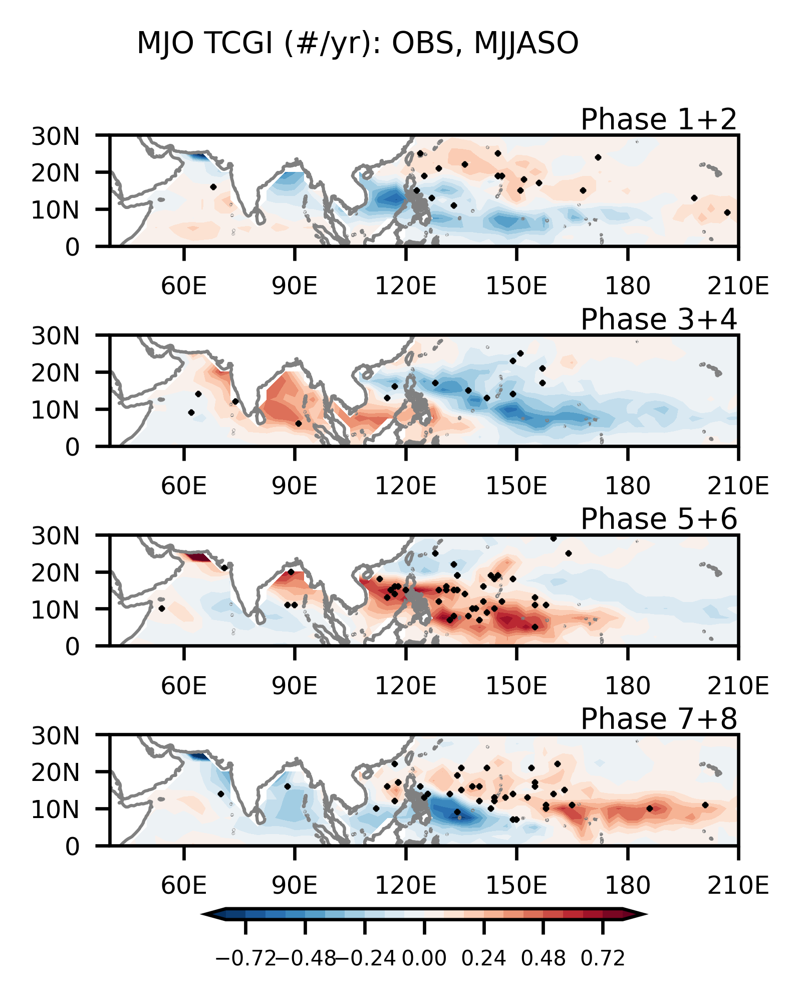

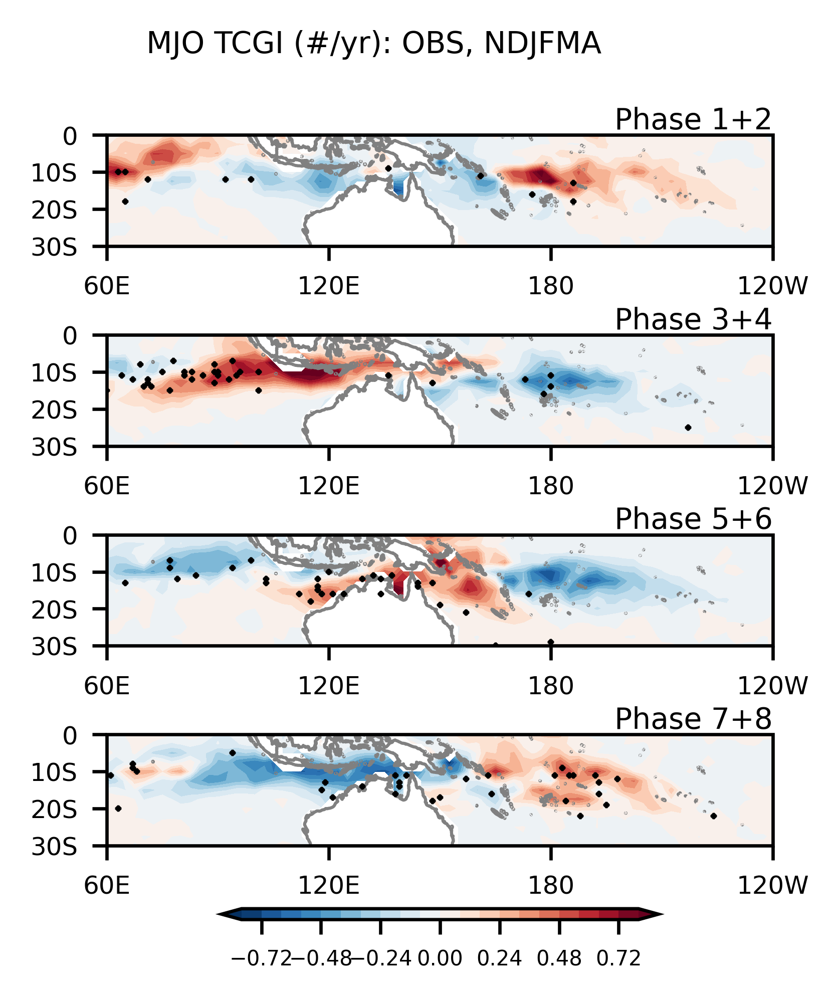

In [66]:
# Plot two phases together (8+1, 2+3, 4+5, 6+7), start here!
season_list = list(['','_MJJASO','_NDJFMA'])
season_list2 = list(['','MJJASO','NDJFMA'])

vname_long = list(['TCGI (#/yr)'])#precipitation (mm/day)','u850 (m/s)','u200 (m/s)'])
vname = list(['TCGI'])#'pr','u850','u200'])
model_name = 'ERA5'
cmap_list = list(['RdBu_r'])#,'RdBu_r','RdBu_r'])
# Version 1
'''
phase_4_list = list(['2+3','4+5','6+7','8+1'])
phase_4_idx = np.array([[2,3],[4,5],[6,7],[1,8]])
print(np.shape(phase_4_idx))

TCGI_4ph_MJJASO = np.empty([4, np.size(lat_TCGI), nlon])

TCGI_4ph_MJJASO[0, :, :] = TCGI_8ph_MJJASO[1,:,:] + TCGI_8ph_MJJASO[2,:,:]
TCGI_4ph_MJJASO[1, :, :] = TCGI_8ph_MJJASO[3,:,:] + TCGI_8ph_MJJASO[4,:,:]
TCGI_4ph_MJJASO[2, :, :] = TCGI_8ph_MJJASO[5,:,:] + TCGI_8ph_MJJASO[6,:,:]
TCGI_4ph_MJJASO[3, :, :] = TCGI_8ph_MJJASO[7,:,:] + TCGI_8ph_MJJASO[0,:,:]
#
TCGI_4ph_NDJFMA = np.empty([4, np.size(lat_TCGI), nlon])
TCGI_4ph_NDJFMA[0, :, :] = TCGI_8ph_NDJFMA[1,:,:] + TCGI_8ph_NDJFMA[2,:,:]
TCGI_4ph_NDJFMA[1, :, :] = TCGI_8ph_NDJFMA[3,:,:] + TCGI_8ph_NDJFMA[4,:,:]
TCGI_4ph_NDJFMA[2, :, :] = TCGI_8ph_NDJFMA[5,:,:] + TCGI_8ph_NDJFMA[6,:,:]
TCGI_4ph_NDJFMA[3, :, :] = TCGI_8ph_NDJFMA[7,:,:] + TCGI_8ph_NDJFMA[0,:,:]
'''
phase_4_list = list(['1+2','3+4','5+6','7+8'])
phase_4_idx = np.array([[1,2],[3,4],[5,6],[7,8]])
print(np.shape(phase_4_idx))

TCGI_4ph_MJJASO = np.empty([4, np.size(lat_TCGI), nlon])

TCGI_4ph_MJJASO[0, :, :] = TCGI_8ph_MJJASO[0,:,:] + TCGI_8ph_MJJASO[1,:,:]
TCGI_4ph_MJJASO[1, :, :] = TCGI_8ph_MJJASO[2,:,:] + TCGI_8ph_MJJASO[3,:,:]
TCGI_4ph_MJJASO[2, :, :] = TCGI_8ph_MJJASO[4,:,:] + TCGI_8ph_MJJASO[5,:,:]
TCGI_4ph_MJJASO[3, :, :] = TCGI_8ph_MJJASO[6,:,:] + TCGI_8ph_MJJASO[7,:,:]
#
TCGI_4ph_NDJFMA = np.empty([4, np.size(lat_TCGI), nlon])
TCGI_4ph_NDJFMA[0, :, :] = TCGI_8ph_NDJFMA[0,:,:] + TCGI_8ph_NDJFMA[1,:,:]
TCGI_4ph_NDJFMA[1, :, :] = TCGI_8ph_NDJFMA[2,:,:] + TCGI_8ph_NDJFMA[3,:,:]
TCGI_4ph_NDJFMA[2, :, :] = TCGI_8ph_NDJFMA[4,:,:] + TCGI_8ph_NDJFMA[5,:,:]
TCGI_4ph_NDJFMA[3, :, :] = TCGI_8ph_NDJFMA[6,:,:] + TCGI_8ph_NDJFMA[7,:,:]

font = 6 # 5 or 6
for isea in range(1, 3):
    for v in range(0,1):#np.size(vname)):  
        v_in = globals()[vname[v]+'_4ph'+season_list[isea]] 

        # Set Contour Level
        if isea == 0:
            clev1 = np.arange(-2.8, 3, 0.2)*0.1*2 # TCGI
            cticks1 = np.arange(-2.4, 3.2, 0.8)*0.1*2
        else:
            clev1 = np.arange(-4, 4.4, 0.4)*0.1*2 # TCGI
            cticks1 = np.array([-3.6, -2.4, -1.2, 0, 1.2, 2.4, 3.6])*0.1*2            

        clev = globals()['clev'+str(v+1)]
        cticks = globals()['cticks'+str(v+1)]

        fig_name = 'Fig.1_MJO_4phase_composite_'+vname[v]+season_list[isea]+'_WPfocus.png'       
                    
        #fig, axes = plt.subplots(4,1,figsize=(6.5, 3.5),dpi=600, subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)} )
        fig, axes = plt.subplots(4,1,figsize=(5.5, 3.5),dpi=600, subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)} )
        plt.subplots_adjust(left=0.1, right=0.98,top=0.9,bottom=0.15,hspace=0.8, wspace=0.1)
        #plt.rcParams.update({'font.size': 7})
        plt.rcParams.update({'font.size': 6})

        for iplt in range(0,4): # Each phase
            plt.subplot(4,1, iplt+1)
            ax = plt.gca()

            V_tmp = v_in[iplt,:,:]
            lon_tmp = lon
            lat_tmp = lat_TCGI

            #print(lon_tmp)
            [xx, yy] = np.meshgrid(lon_tmp, lat_tmp)        
            
            # Handle the data to prevent white line
            [V_tmp_cyclic, lon_cyclic] = cartopy_util.add_cyclic_point(
                V_tmp.T, 
                coord=lon_tmp,
                axis=0
            )

            ax.coastlines(color='grey', linewidth=0.75)
            #######
            # Version 1: 60E to 60 W
            #plt.xlim([-60, 60])
            #ax.set_xticks(np.arange(60,360,60), crs=ccrs.PlateCarree())
            #ax.set_xticklabels(['60E', '120E', '180', '120W', '60W'], fontsize=font)
            ####################
            # Version 2: 0 to 60 W
            #ax.set_xticks(np.arange(0,360,60), crs=ccrs.PlateCarree())
            #ax.set_xticklabels(['0', '60E', '120E', '180', '120W', '60W'], fontsize=font)
            ###################           
            if isea == 0:
                ax.set_yticks(np.arange(-30,45,15), crs=ccrs.PlateCarree())
                ax.set_yticklabels(['30S','15S', '0','15N','30N'], fontsize=font)
            elif isea == 1:
                ax.set_yticks(np.arange(0,40,10), crs=ccrs.PlateCarree())
                ax.set_yticklabels(['0','10N','20N','30N'], fontsize=6) 
                plt.ylim([0, 30])
                # Version 3: 60E to 20W
                plt.xlim([-140, 30])
                ax.set_xticks(np.arange(60,240,30), crs=ccrs.PlateCarree())
                ax.set_xticklabels(['60E','90E', '120E','150E','180','210E'], fontsize=font)
            elif isea == 2:
                ax.set_yticks(np.arange(-30,10,10), crs=ccrs.PlateCarree())
                ax.set_yticklabels(['30S','20S','10S','0'], fontsize=6) 
                plt.ylim([-30, 0])
                # Version 3: 60E to 60W
                plt.xlim([-120, 60])
                ax.set_xticks(np.arange(60,300,60), crs=ccrs.PlateCarree())
                ax.set_xticklabels(['60E','120E','180','120W'], fontsize=font)


            # Plot the TCGI data
            contour = plt.contourf(
                lon_cyclic, lat_tmp, V_tmp_cyclic.T, cmap=cmap_list[v],
                transform=ccrs.PlateCarree(), levels= clev, extend='both'
            )

            # Plot TC genesis location
            for iph in range(0, 2):
                #print(phase_4_idx[iplt, iph])
                lon_TC_tmp = globals()['lon_TC_phase'+str(phase_4_idx[iplt,iph])+season_list[isea]]
                lat_TC_tmp = globals()['lat_TC_phase'+str(phase_4_idx[iplt,iph])+season_list[isea]]

                lon_TC_adj = np.where(lon_TC_tmp>180, -360+lon_TC_tmp, lon_TC_tmp)
                lon_TC_adj2 = np.where(lon_TC_adj>=0, lon_TC_adj-180, lon_TC_adj)
                lon_TC_adj3 = np.where(lon_TC_adj<0, lon_TC_adj+180, lon_TC_adj2)
                if isea == 0:
                    plt.plot(lon_TC_adj3, lat_TC_tmp, 'kx', markersize=0.4)
                else:
                    plt.plot(lon_TC_adj3, lat_TC_tmp, 'kx', markersize=1)
            

            ax.set_title('Phase '+phase_4_list[iplt], pad=1,loc='right',fontsize=font+1)
        
        #plt.suptitle('MJO composite '+vname_long[v]+' (OBS)'+ ' '+season_list[isea], y=0.96)
        plt.suptitle('MJO '+vname_long[v]+': OBS, '+season_list2[isea], y=1)

        #cb = fig.colorbar(contour, ax=axes[:], orientation='horizontal',shrink=0.56, fraction=0.02, pad=0.08, aspect=40)           
        cb = fig.colorbar(contour, ax=axes[:], orientation='horizontal',shrink=0.3, fraction=0.02, pad=0.08, aspect=40)  
        cb.ax.tick_params(labelsize=5)
        cb.set_ticks(cticks)    
        plt.savefig(fig_dir_era5+fig_name,format='png', dpi=600) # Change this to be fig_dir_ace2 if using ace data
        plt.show() 
        plt.close()

# Calculate TCGI averaged for each basin

In [27]:
TCGI_ano_basin        = np.empty([nphase, nbasin])
TCGI_ano_basin_MJJASO = np.empty([nphase, nbasin])
TCGI_ano_basin_NDJFMA = np.empty([nphase, nbasin])

for ibasin in range(0, nbasin):
    
    # Mark each basin
    ilatmin = np.argwhere(lat_TCGI==basin_lat_min[ibasin]).squeeze()
    ilatmax = np.argwhere(lat_TCGI==basin_lat_max[ibasin]).squeeze()
    ilonmin = np.argwhere(lon_TCGI==basin_lon_min[ibasin]).squeeze()
    ilonmax = np.argwhere(lon_TCGI==basin_lon_max[ibasin]).squeeze()
    #
    

    # All year
    tmp = np.nansum(TCGI_8ph[:,ilatmin:ilatmax+1,ilonmin:ilonmax+1], 1)
    TCGI_ano_basin[:,ibasin] = np.nansum(tmp, 1)

    # Separate season
    tmp = np.nansum(TCGI_8ph_MJJASO[:,ilatmin:ilatmax+1,ilonmin:ilonmax+1], 1)
    TCGI_ano_basin_MJJASO[:,ibasin] = np.nansum(tmp, 1)    
    tmp = np.nansum(TCGI_8ph_NDJFMA[:,ilatmin:ilatmax+1,ilonmin:ilonmax+1], 1)
    TCGI_ano_basin_NDJFMA[:,ibasin] = np.nansum(tmp, 1)   

# Select only MJJASO for NH, NDJFMA for SH
TCGI_ano_basin_summer = np.empty([nphase, nbasin])
TCGI_ano_basin_summer[:,:4] = TCGI_ano_basin_MJJASO[:,:4]
TCGI_ano_basin_summer[:,4:] = TCGI_ano_basin_NDJFMA[:,4:]

In [31]:
# Save data for MJO composite TCGI and TC genesis (line plot for each MJO phase)

output2 = file_dir_out+'MJO_8ph_composite_lineplot_TC_TCGI_ERA5_2001_2010_summer.npz'
np.savez(output2, TC_genesis_MJO_phase_basin_ano=TC_genesis_MJO_phase_basin_ano, phase=phase, TCGI_ano_basin_summer=TCGI_ano_basin_summer) 

# Plot TCGI and TC genesis for each phase

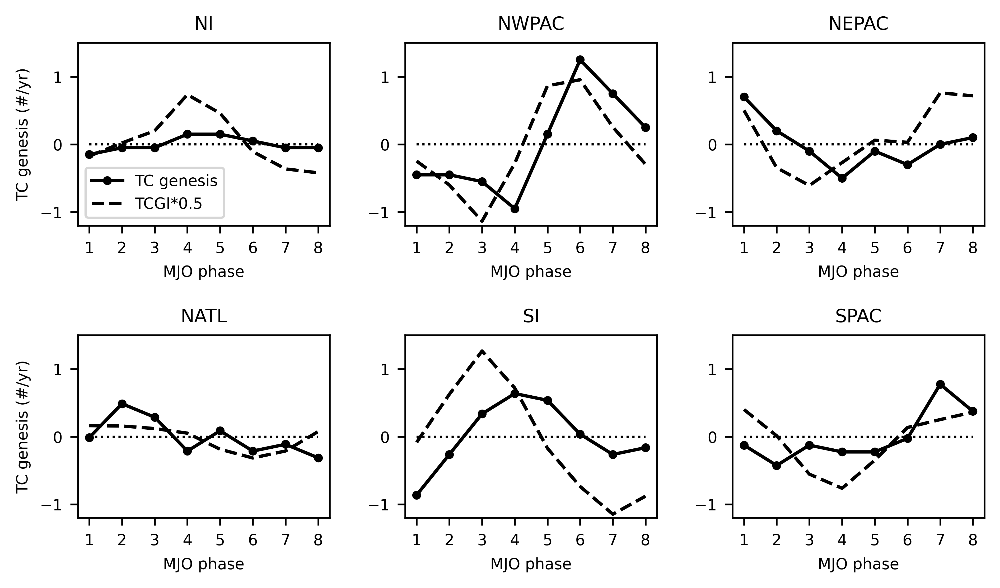

In [54]:
# Plot TC genesis modulated by MJO for each basin
nphase = 8
fig_name = 'Fig.2_MJO_8phase_composite_TCgenesis_TCGI_lineplot_summer.png'     
fig, axes = plt.subplots(2,3,figsize=(6.5, 4),dpi=600 )  
plt.subplots_adjust(left=0.1, right=0.98,top=0.9,bottom=0.15,hspace=0.6, wspace=0.3)
plt.rcParams.update({'font.size': 7})

for ibasin in range(0, nbasin):
    plt.subplot(2, 3, ibasin+1)
    zeros = np.zeros([nphase])
    phase = np.arange(1,9)
    plt.plot(phase, TC_genesis_MJO_phase_basin_ano[:,ibasin]/10, 'k-o',markersize=3)
    #plt.plot(phase, TCGI_ano_basin[:,ibasin]/10, 'k--')
    plt.plot(phase, TCGI_ano_basin_summer[:,ibasin]/10*0.5, 'k--')
    plt.plot(phase, zeros, 'k:', linewidth=1)
    plt.title(basin_list[ibasin])
    plt.xticks(phase)
    plt.ylim([-1.2,1.5])
    plt.yticks(np.arange(-1,2,1))
    plt.xlabel('MJO phase')
    if ibasin == 0 or ibasin == 3:
        plt.ylabel('TC genesis (#/yr)')
    if ibasin == 0:
        plt.legend(['TC genesis','TCGI*0.5'])
plt.savefig(fig_dir_era5+fig_name,format='png', dpi=600)
plt.show()

In [111]:
print(n)

[1162 1184 1101 1029 1174 1157 1032 1073 5692]


# Scatter plot between TCGI and TC number

In [48]:
# Normalize by number of days of MJO (summer only)

MJO_snapshot = np.empty([nphase, nbasin])
for ibasin in range(0, nbasin):

    if ibasin <=3: #NH
        n_tmp = n_MJJASO
    else:
        n_tmp = n_NDJFMA

    MJO_snapshot[:,ibasin] = n_tmp[:-1]

In [79]:
print(MJO_snapshot)

[[692. 692. 692. 692. 484. 484.]
 [738. 738. 738. 738. 458. 458.]
 [508. 508. 508. 508. 604. 604.]
 [454. 454. 454. 454. 577. 577.]
 [680. 680. 680. 680. 505. 505.]
 [631. 631. 631. 631. 516. 516.]
 [511. 511. 511. 511. 530. 530.]
 [459. 459. 459. 459. 608. 608.]]


In [76]:
# Normalize TC_genesis_MJO_phase_basin_ano by the maximum for each basin
# (not used)
#TC_genesis_MJO_phase_basin_ano_normalize = TC_genesis_MJO_phase_basin_ano/np.max(TC_genesis_MJO_phase_basin_ano, 0)

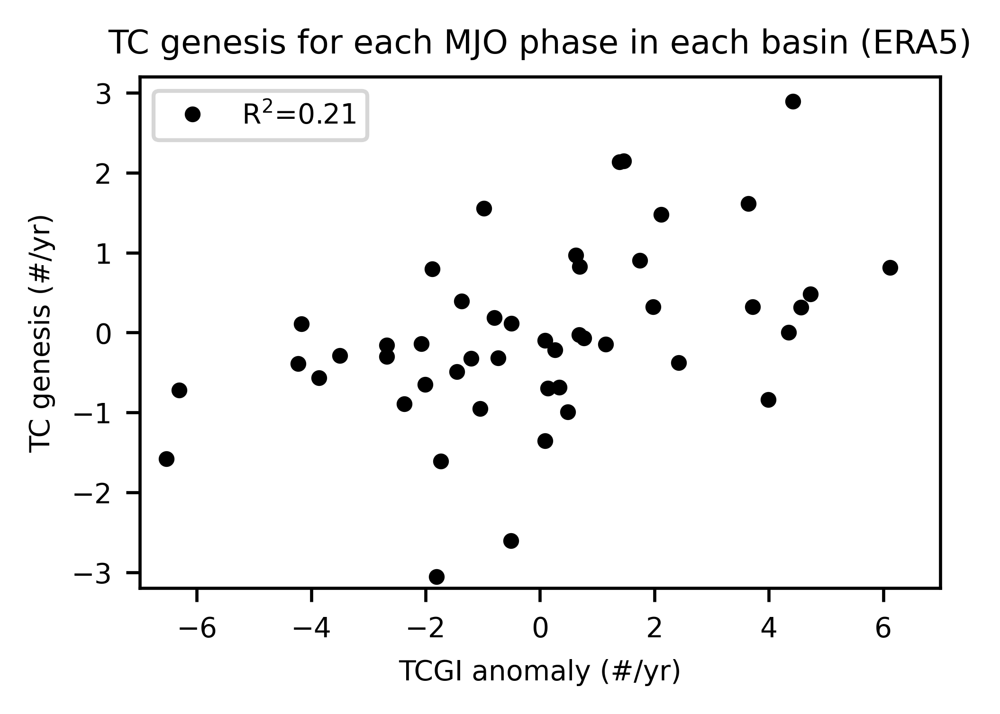

In [51]:
# Plot scatter plot

#TCGI_tmp = globals()['TCGI_ano_basin'] # all year!
TCGI_tmp = globals()['TCGI_ano_basin_summer']

TC_genesis_tmp = np.ndarray.flatten(TC_genesis_MJO_phase_basin_ano/MJO_snapshot/10*365.25*4) # Unnormalized
#TC_genesis_tmp = np.ndarray.flatten(TC_genesis_MJO_phase_basin_ano_normalize/MJO_snapshot/10*365.25*4) #Normalized

#TCGI_tmp = np.ndarray.flatten(TCGI_ano_basin/MJO_snapshot/10*365.25*4) # all year!
TCGI_tmp = np.ndarray.flatten(TCGI_tmp/MJO_snapshot/10*365.25*4)

# Calculate R^2
tmp = np.corrcoef(TCGI_tmp, TC_genesis_tmp)
r2 = tmp[0,1]**2
# save r^2
r2_str = f"{r2:.2f}"

fig_name = 'Fig.3_MJO_8phase_composite_TCgenesis_TCGI_scatterplot.png'     
fig, axes = plt.subplots(1,1,figsize=(3.2, 2.4),dpi=600 )  
plt.subplots_adjust(left=0.1, right=0.98,top=0.9,bottom=0.15,hspace=0.6, wspace=0.3)
plt.rcParams.update({'font.size': 7})
plt.plot(TCGI_tmp, TC_genesis_tmp, 'ko', markersize=3)
plt.title('TC genesis for each MJO phase in each basin (ERA5)')
plt.xlabel('TCGI anomaly (#/yr)')
plt.ylabel('TC genesis (#/yr)')
plt.legend(['R$^{2}$='+r2_str])
plt.axis([-7, 7, -3.2, 3.2])
plt.savefig(fig_dir_era5+fig_name,format='png', dpi=600)
plt.show()